In [194]:
import os
import re
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import unicodecsv as csv
import seaborn as sns
from collections import Counter
from cycler import cycler
from textwrap import wrap
from IPython.display import display, HTML, Markdown, Math, Latex

# Analysize variables.

In [2]:
# Read documentation.
columns_file = r"../records_documentation.txt"

with open(columns_file,"r") as f:
    columns = f.readlines()
columns
        

['[Column 0] ID\n',
 '[Column 1] Birth year: deduced from education history, where available\n',
 '[Column 2] Gender flag: 1=female, 2=male, 0=unknown\n',
 '[Column 3] Skillset1: primary skillset deduced from self-reported skills\n',
 '[Column 4] Skillset1 weight: the extent to which primary skillset is representative of overall self-reported skills\n',
 '[Column 5] Skillset2: secondary skillset deduced from self-reported skills\n',
 '[Column 6] Skillset2 weight: the extent to which secondary skillset is representative of overall self-reported skills\n',
 '[Column 7] City of profile (does not change): where unavailable, the field is left blank\n',
 '[Column 8] Country of Profile (does not change)\n',
 '[Column 9] Education (highest degree attained): 0=none/unknown; 1=high school; 2=vocational degree; 3=associateÕs; 4=bachelorÕs; 5=masterÕs other than MBA; 6=MBA; 7=doctorate (PhD/JD/MD) [NB: Romanian names not covered]\n',
 "[Column 10] Elite institution: a flag indicating whether any o

So:
- Unique identifier: ID.
- Variable Groups:
    - Column 0-10, profile info; 
    - Column 11-28, employment or education info; (c26 = False or True)
        - Column 11-18, general info;
        - Column 19-25, company info;
        - Column 27-28, school info.

In [3]:
# Define an iterator for reading rows.
def rows_iter(index=True):
    if index:
        for index, (line, ticker) in enumerate(rows_iter(index=False)):
             yield index, line, ticker
    else:
        empl_path = r"../banks_big/"
        empl_file_lst = os.listdir(empl_path)
        for empl_file_name in empl_file_lst:
            empl_file = empl_path+empl_file_name
            ticker = empl_file_name[:-4].upper()
            with open(empl_file,"rb") as f:
                reader = csv.reader(f,encoding='utf-8',escapechar='',delimiter='\t')
                for line in reader:
                    del line[1]
                    yield line, ticker

In [4]:
# Get unique values for each variable.
unique_values = []
for i in range(33):
    unique_values.append(set())
# Get unique values for each variable.
for idx, line, ticker in rows_iter():
    for i in range(33):
        unique_values[i].add(line[i])
for idx, values in enumerate(unique_values):
    print("[Column {}] ".format(idx)+str(len(values)))

[Column 0] 997405
[Column 1] 84
[Column 2] 3
[Column 3] 45
[Column 4] 317263
[Column 5] 45
[Column 6] 317263
[Column 7] 12562
[Column 8] 231
[Column 9] 8
[Column 10] 2
[Column 11] 941
[Column 12] 3
[Column 13] 817
[Column 14] 3
[Column 15] 2
[Column 16] 4500
[Column 17] 2216338
[Column 18] 846
[Column 19] 1383277
[Column 20] 1186567
[Column 21] 9121
[Column 22] 275
[Column 23] 2
[Column 24] 209110
[Column 25] 729
[Column 26] 2
[Column 27] 8
[Column 28] 2
[Column 29] 1319
[Column 30] 72
[Column 31] 6548
[Column 32] 969724


In [5]:
# One block to convert data to pd.DataFrame.
entries_lst = []
for idx, line, ticker in rows_iter():
    if idx == 20: # Control number of rows.
        break
    entries_lst.append([ticker]+line)

samples_lst = entries_lst
entries_df = pd.DataFrame(data=entries_lst)
entries_df.loc[:,[18,19]]


,18,19
0,"Senior Team Member,team member,senior",
1,,
2,"Loan Administrator Officer,administrator,officer",ACCOUNTING
3,"Senior Commerical Real Estate Loan Closer,real...","OPERATIONS,ACCOUNTING"
4,"VP Technology Project Team Mgr,vice president,...",TECHNOLOGY
5,,
6,"""Bachelor’s Degree, Computer Science, First Cl...",
7,"""Master’s Degree, Computer Science, A"",Master’...",
8,"Software Trainee,software,trainee",TECHNOLOGY
9,"Assistant Software Engineer,software engineer,...",TECHNOLOGY


In [6]:
# Get an example.
entry = samples_lst[3]
for i in range(len(entry)):
    print("[Column {}] ".format(i)+entry[i])

[Column 0] BAC
[Column 1] e76ef1e8-2aa8-3558-b553-17631ee38d0b
[Column 2] 2000
[Column 3] 1
[Column 4] Banking and Finance
[Column 5] 0.7901346408350717
[Column 6] Middle Management
[Column 7] 0.13456830414964885
[Column 8] Seattle
[Column 9] United States
[Column 10] 0
[Column 11] False
[Column 12] 2013-06-01
[Column 13] True
[Column 14] None
[Column 15] False
[Column 16] True
[Column 17] 1966
[Column 18] Senior Commerical Real Estate Loan Closer,real estate,senior,closer
[Column 19] OPERATIONS,ACCOUNTING
[Column 20] HomeStreet Bank
[Column 21] homestreet
[Column 22] 
[Column 23] UNITED STATES
[Column 24] False
[Column 25] seattle, wa
[Column 26] 52
[Column 27] False
[Column 28] 
[Column 29] False
[Column 30] 
[Column 31] 
[Column 32] 
[Column 33] 1537569690827


# Aggregate employment changes to the firm-by-date level.

Definition of employment change types: When only employment records are considered, an employment change will be recognized as
- `hiring` if it changed its company to one of the companies (listed [here](#company_lst));
- `firing` if it changed its company from one of the companies to `TIME_OFF` and stayed in `TIME_OFF` for more than 100 days;
- `leaving` if it changed its company from one of the companies and not recogized as `firing`.

In [7]:
# Define a class to read and process entries.
class entryProcessor:    
    
    def __init__(self, person_id, ticker=None):
        self.person_id = person_id
        self.profile = [None]*7 # "birth_year","gender","skill1","skill2","country","education_level","f_elite"
        self.employment = [None]*7 # "start_date","end_date","ticker","f_current","job_role","department", "nth_posit"
        self.ticker = ticker
        
    # Three functions to output records.
    # Varlist: Hiring/Leaving/Firing, Ticker, year-month, profile_info: [...], next_industry.
    def enter_record(self):
        return ['hiring',self.employment[2],self.employment[0]
               ]+self.profile+[self.employment[4],self.employment[5]
                              ]+['']+['',''] 
    def leave_record(self,next_industry):
        return ['leaving',self.employment[2],self.employment[1]
               ]+self.profile+[self.employment[4],self.employment[5]
                              ]+[next_industry]+[entryProcessor.time_diff(self.employment[1],self.employment[0]),
                                                 self.employment[6]]
    def fired_record(self):
        return ['firing',self.employment[2],self.employment[1]
               ]+self.profile+[self.employment[4],self.employment[5]
                              ]+['']+[entryProcessor.time_diff(self.employment[1],self.employment[0]),
                                      self.employment[6]]
    
    # When id changes, record a possible leave and then clear contents.
    def reinitialize(self,entry):
        if self.employment[3]=="False":
            record = self.leave_record('')
        else:
            record = None
        self.__init__(entry[0],self.ticker)
        self.profile = [entry[x] for x in [1,2,3,5,8,9,10]]
        if entry[6] is not None:
            self.profile[3] = '' if float(entry[6])<0.1 else entry[5]
        return record
    
    # Main method: read and process.
    def read(self,entry,ticker):
        record = []
        self.ticker = ticker
        # Reinitialize when id changes.
        if self.person_id != entry[0]:
            leave_last = self.reinitialize(entry)
            if leave_last is not None:
                record.append(leave_last)
        # Then deal with the current entry.
        if entry[3] != "-1" and entry[26] == "False" and not sum([
            re.search(r"(?i)\W{}\W".format(x)," "+entry[17]+" ") is not None for x in ["intern","internship","trainee","student","summer"]
        ]):
            if self.employment[2] != entry[21]:
                if self.employment[2] == self.ticker:
                    if entry[25] == "TIME_OFF" and int(entry[16]) > 100:
                        record.append(self.fired_record())
                    else:
                        record.append(self.leave_record(entry[25]))
                self.employment = [None]*7
                if entry[21] == self.ticker:
                    self.employment[0] = entryProcessor.convert_time(entry[11],entry[12])
                    self.employment[1] = entryProcessor.convert_time(entry[13],entry[14])
                    self.employment[2] = entry[21]
                    self.employment[3] = entry[15]
                    self.employment[4] = entry[17]
                    self.employment[5] = entry[18]
                    self.employment[6] = 0
                    record.append(self.enter_record())
            else:
                self.employment[1] = entryProcessor.convert_time(entry[13],entry[14])
                self.employment[3] = entry[15]
                self.employment[6] += 1
        return record
            
    # Unbound methods.
    def convert_time(date,f_valid_month):
        date_regex = re.match(r"(\d{4})-(\d{2})-\d{2}",date)
        if date_regex is None:
            return None
            #raise ValueError('Not a proper date: {}'.format(date))
        else:
            return date_regex.group(1)+('00' if f_valid_month == 'False' else date_regex.group(2))
    
    def time_diff(end_date,start_date):
        if end_date is not None and start_date is not None:
            edt, sdt = int(end_date), int(start_date)
            yr_diff = edt//100-sdt//100
            emth = edt%100
            smth = sdt%100
            if not yr_diff and not (emth and smth):
                return min(6,(emth-smth-1)%12+1)
            else:
                return yr_diff*12+(emth if emth else 6)-(smth if smth else 6)
        else:
            return np.nan
        
    # For print.
    def __str__(self):
        return "[person_id: {}, profile: {}, employment: {}]".format(self.person_id, self.profile, self.employment)
            
#entry = entryProcessor(None)
#for i in range(50):
#    print(i)
#    print(entry.read(samples_lst[i]))
#    print(entry)

In [8]:
# Read, Identify & Aggregate.

## Initialize.
career = entryProcessor(None)

## Iterate.
empl_changes_lst = []
for idx, entry, ticker in itertools.chain(rows_iter(),[(None,[None]*33,"")]):
    if idx == np.inf: # End point.
        break
    ticker = {"BAC":"BAC","CITI":"C","GS":"GS","JPM":"JPM","MS":"MS","WFC":"WFC","":None}[ticker]
    empl_change_this = career.read(entry, ticker)
    if empl_change_this != []:
        empl_changes_lst += empl_change_this

varlist = [
    "type","ticker","yrmth","birth","gender","skill1","skill2","cntry","edu","f_elite",
    "job_role","depmt","ind_next","tenure","nprom"
]
empl_changes_df_0 = pd.DataFrame(data=empl_changes_lst,columns=varlist)
empl_changes_df = empl_changes_df_0[lambda df:df.skill1=="Banking and Finance"]


A block prepared for counting annual employment.

In [9]:
ticker_this = None
res_dict = {}
for idx, entry, ticker in rows_iter():
    if idx == np.inf: # End point.
        break
    ticker = {"BAC":"BAC","CITI":"C","GS":"GS","JPM":"JPM","MS":"MS","WFC":"WFC","":None}[ticker]
    if ticker != ticker_this:
        ticker_this = ticker
        res_dict[ticker] = Counter([])
    if entry[21] == ticker_this and entry[3] == "Banking and Finance" and entry[26] == "False":
        if entry[11] != "None" and (entry[13] != "None" or entry[15] == "True"):
            res_dict[ticker] += Counter(
                range(
                    pd.to_datetime(entry[11]).year,
                    pd.to_datetime(entry[13]).year if entry[13]!="None" else 2019
                )
            )

empl_by_years = pd.DataFrame(res_dict).fillna(0).unstack().reset_index()
empl_by_years.columns = ["ticker", "year", "employment"]

# Summarize and plot.

<a id='company_lst'></a>
**For only those with "Banking and Finance" as their primary skillsets in:**
- **BAC**: Bank of America.
- **C**: Citibank.
- **GS**: Goldman Sachs.
- **JPM**: JPMorgan Chase.
- **MS**: Morgan Stanley.
- **WFC**: Wells Fargo.

In [10]:
# Colors.
color_styles = ['g','r','c','m','y']
line_styles = ['-','--','-']
marker_styles = ['o','^','^']

In [11]:
# Deal with 'yrmth'.
empl_changes_df = empl_changes_df.assign(
    year = lambda df:df.yrmth.apply(lambda x:int(x[:4]) if x is not None else np.nan),
    month = lambda df:df.yrmth.apply(lambda x:int(x[4:]) if x is not None else -1)
)
empl_changes_df_0 = empl_changes_df_0.assign(
    year = lambda df:df.yrmth.apply(lambda x:int(x[:4]) if x is not None else np.nan),
    month = lambda df:df.yrmth.apply(lambda x:int(x[4:]) if x is not None else -1)
)

empl_changes_df.describe(include=[np.object])

,type,ticker,yrmth,birth,gender,skill1,skill2,cntry,edu,f_elite,job_role,depmt,ind_next,tenure,nprom
count,208676,208676,202235,208676,208676,208676,208676,208676,208676,208676,208676,208676,208676,206059,208676
unique,3,6,692,84,3,1,44,165,8,2,54682,250,380,504,14
top,hiring,C,200700,2000,2,Banking and Finance,,United States,4,False,"Vice President,vice president",,,,
freq,120848,54373,2179,46405,105900,208676,91622,133097,93156,182011,8773,101676,151822,120848,120848


## Count the number of employees from Dec., 1989 on.

Note: 
- This block counts the number of currently employment for the firms by calculating the cumulative sums of the net employment increase, that is, hiring minus the sum of firing and leaving.
- This method is not effective for the early years. However, if we can assure that we have all the resumes after some time, we will have the correct number after all the employment before that time have left the company. We assume that the number is correct after 1989 except the most recent years.
- All the numbers are counted in the end of the year and will be used to calculate the proportion of the employment changes for next year. Note that we do not calculate monthly employment separately since there are a good proportion of our data with invalid months.

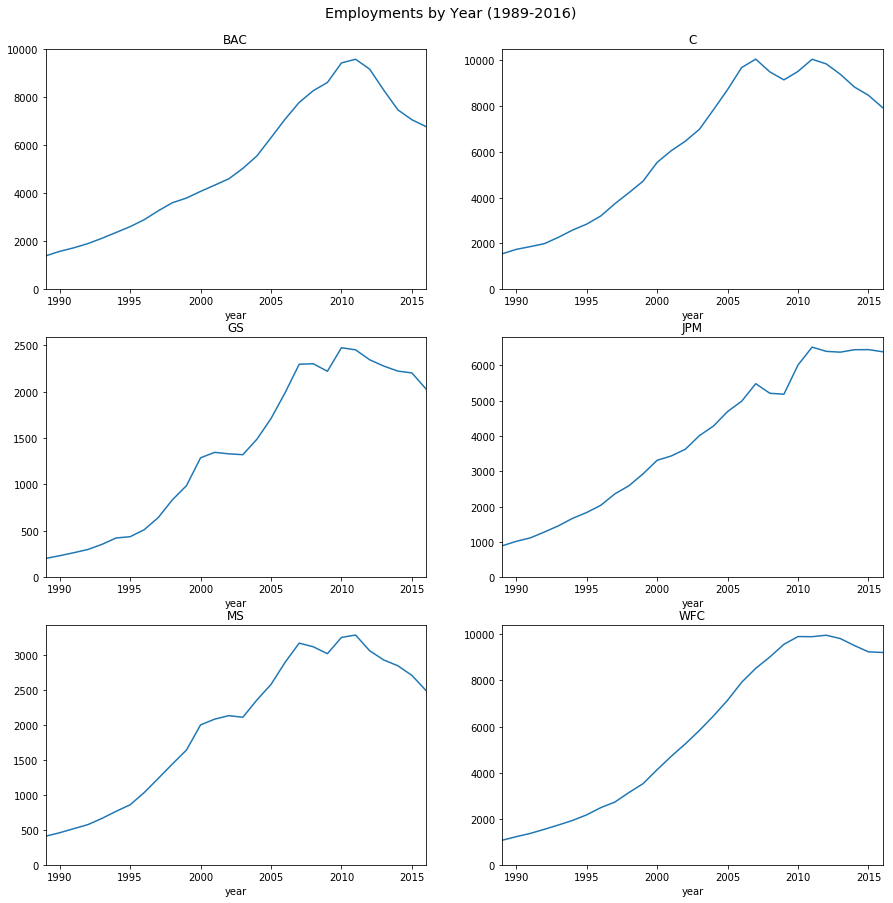

In [12]:
# count_by_years = pd.DataFrame({'count':empl_changes_df.groupby(['ticker','type','year']).size()}).reset_index()
# empl_by_years = count_by_years.groupby(['ticker','type']).apply(
#     lambda df:df.sort_values(['year']).assign(cumsum = lambda df2:df2['count'].cumsum()) # Calculate cumsum.
# ).reset_index(drop=True).pivot_table(
#     index=['ticker','year'],columns='type',values=['cumsum'],fill_value=0 # Reshape to wide format.
# ).assign(
#     employment=lambda df:(df['cumsum']['hiring']-df['cumsum']['firing']-df['cumsum']['leaving']) # Get employment.
# ).drop('cumsum',axis=1).reset_index()
# empl_by_years.columns = empl_by_years.columns.droplevel('type')

# Plot.
fig, axs = plt.subplots(3,2,figsize=(15,15))
fig.suptitle("Employments by Year (1989-2016)", fontsize="x-large",y=0.92)
for (ticker, col), ax in zip(
    empl_by_years.pivot_table(
        index='year',columns='ticker',values='employment',fill_value=0
    ).loc[lambda df:(df.index>=1989)&(df.index<=2016)].iteritems(),
    itertools.chain.from_iterable(axs)
):
    col.plot(ax=ax, title=ticker).set_ylim(bottom=0)
plt.show()

## Overall trends.
Note: Plots by year and plots by months do not only differ in frequency, but also in sample size. This is due to the entries without valid month record.

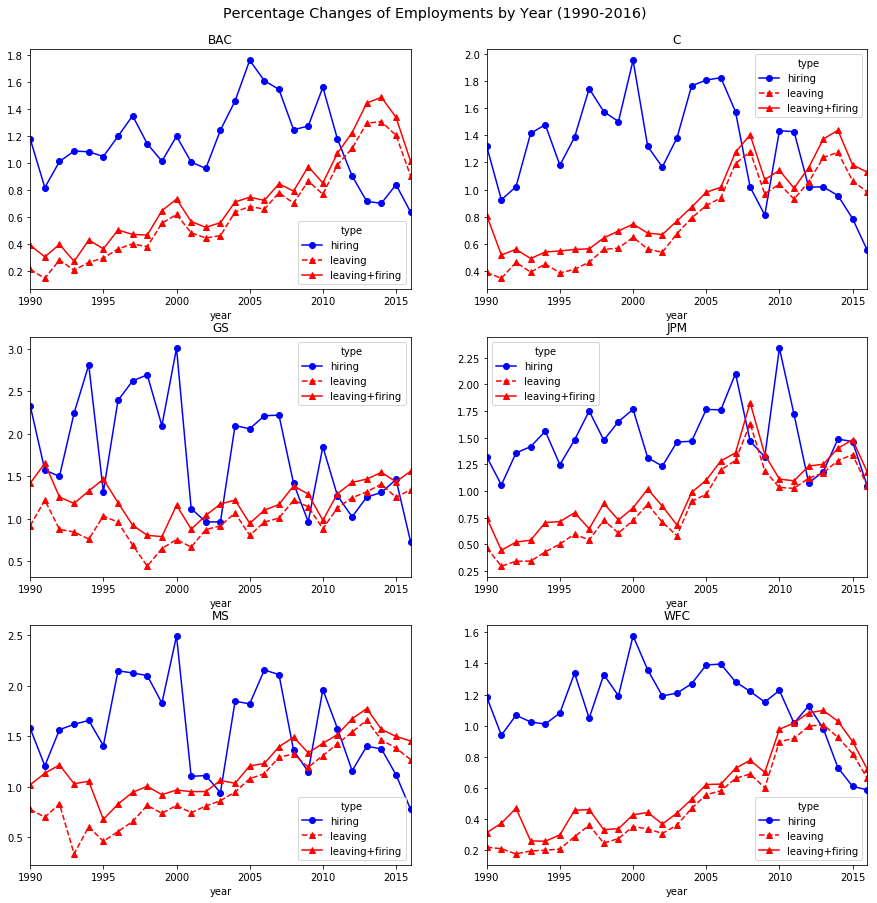

In [13]:
# Count and calculate percentages of employment changes.
prop_by_months = pd.DataFrame(
    {'count':empl_changes_df.groupby(['ticker','type','year','month']).size()} # Count by month.
).reset_index().merge(
    right=empl_by_years.assign(year_1L=lambda df:df.year+1)[['ticker','year_1L','employment']],
    left_on = ['ticker','year'], right_on = ['ticker','year_1L'] # Merge with last year's employment.
).assign(
    prop=lambda df:df['count']/df['employment']*100 # Calculate proportions.
).drop(
    ['count','year_1L','employment'],axis=1 # Drop unnecessary variables.
).loc[lambda df:(df.year>=1990)&(df.year<=2016)] # Keep only [1990, 2016] segment.

# Plot by year.
fig, axs = plt.subplots(3,2,figsize=(15,15))
fig.suptitle("Percentage Changes of Employments by Year (1990-2016)", fontsize="x-large",y=0.92)
for (ticker, grp), ax in zip(
    prop_by_months.pivot_table(
        index = ['ticker','year'], columns = 'type', values = 'prop', fill_value=0
    ).reset_index().assign(
        **{"leaving+firing":lambda df:df.leaving+df.firing}
    ).drop("firing",axis=1).groupby('ticker'),
    itertools.chain.from_iterable(axs)
):
    grp.drop('ticker',axis=1).loc[lambda df:df.year>=1990].set_index('year').plot(
        ax=ax, title=ticker, xticks=[1990,1995,2000,2005,2010,2015], xlim=(1990,2016), style=['b-o','r--^','r-^']
    )
plt.show()

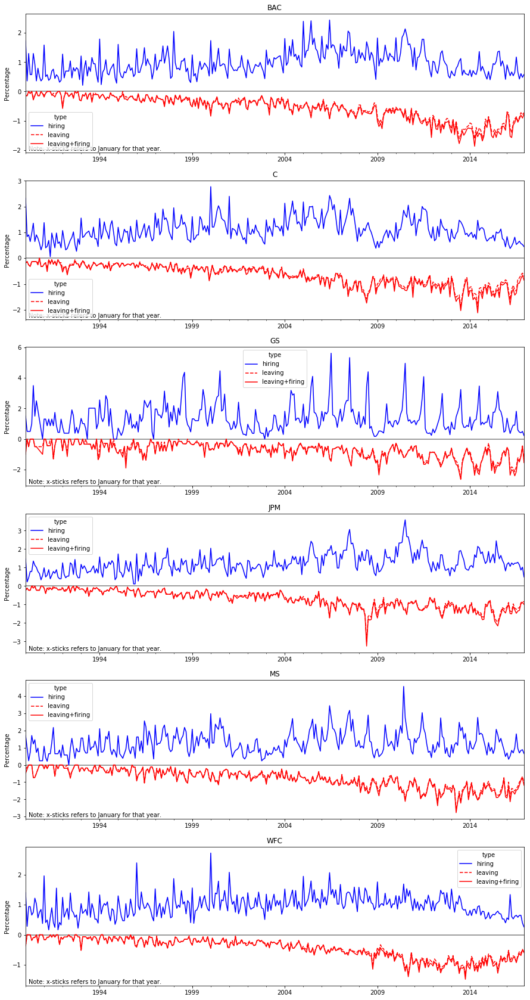

In [14]:
start_year=1990
end_year=2016
fig, axs = plt.subplots(6,1,figsize=(15,30))
for (ticker, grp),ax in zip(
    prop_by_months.loc[lambda df:(df.month!=0)&(df.year>=start_year)&(df.year<=end_year)].pivot_table(
        index = ['ticker','year','month'], columns='type', values = 'prop', fill_value=0
    ).reset_index().assign(
        **{
            "leaving+firing":lambda df:-(df.leaving+df.firing),
            "leaving":lambda df:-df.leaving,
            "yrmth":lambda df:pd.PeriodIndex(year=df.year,month=df.month,freq='M')
        }
    ).set_index('yrmth').groupby('ticker'),
    axs
):
    grp.loc[lambda df:df.year>=1990][['hiring','leaving','leaving+firing']].plot(
        ax=ax,title=ticker,style=['b-','r--','r-'],
        xlim=(pd.Period('{}-01'.format(1990)),pd.Period('{}-12'.format(2016))),
        #xticks=[pd.Period('{}-01'.format(int(x*5+1990))) for x in range(5)]
    )
    ax.set_ylabel('Percentage')
    ax.set_xlabel('')
    ax.hlines(0,pd.Period('{}-01'.format(1990)),pd.Period('{}-12'.format(2016)),colors='tab:gray')
    ax.annotate("Note: x-sticks refers to January for that year.",(5,3),xycoords="axes points")
plt.show()

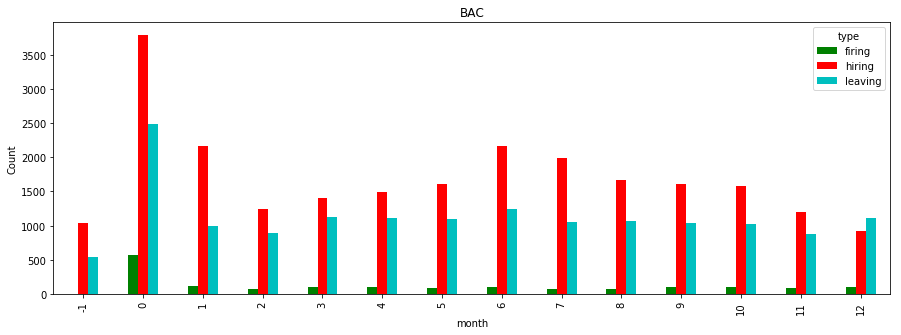

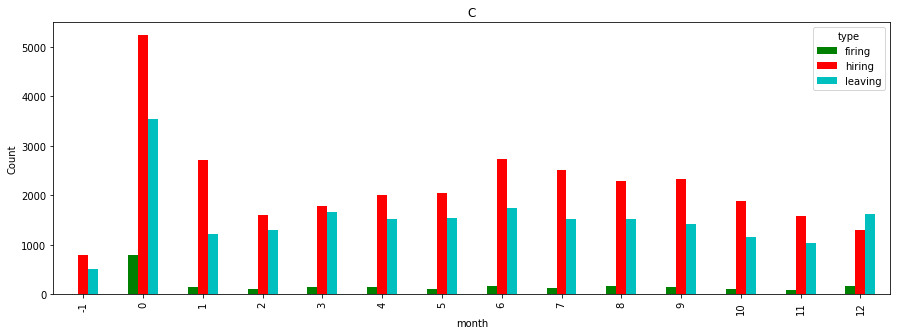

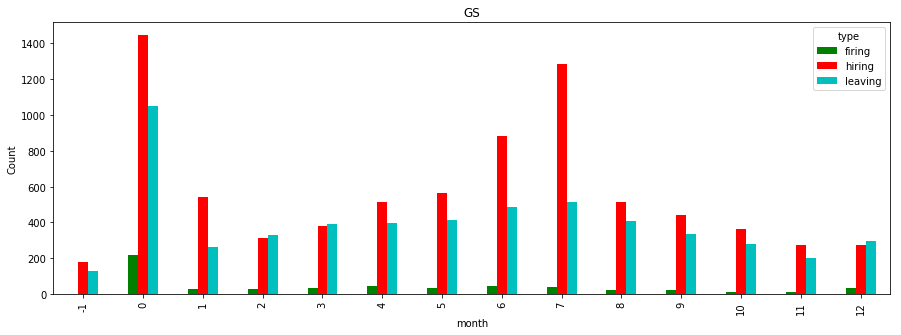

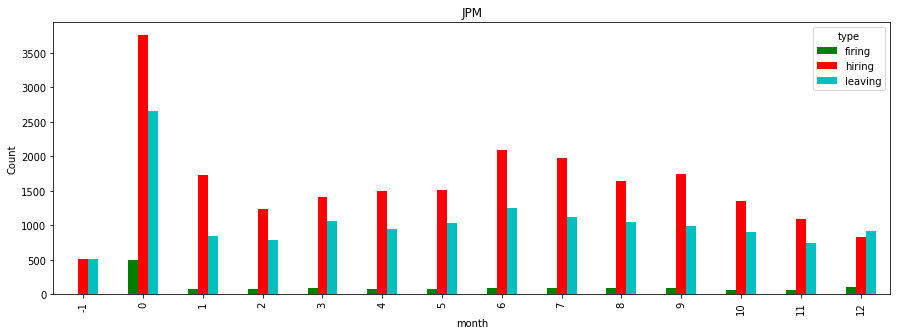

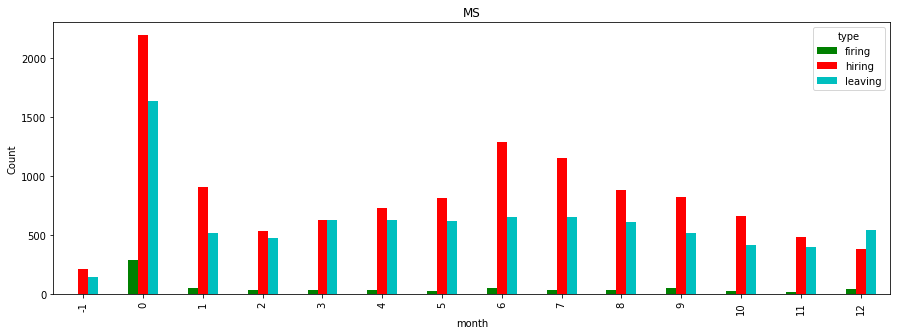

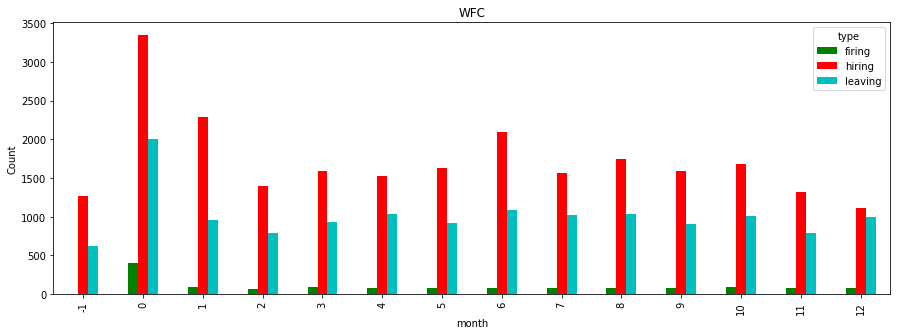

In [15]:
# Month composition.
display(HTML("<center><strong>Month Composition (-1: None, 0: Invalid month)</strong></center>"))
for idx, grp in empl_changes_df.groupby(['ticker']):
    grp.assign(count=1).pivot_table(
        index = 'month', columns = 'type', values='count', aggfunc='sum', fill_value=0
    ).plot.bar(figsize=(15,5),color=color_styles,title=idx).set_ylabel("Count")
    plt.show()

## By birth group.
Note: Birth year `2000` seems to be a trash bin for problematic records and thus will be treated the same as `None`.

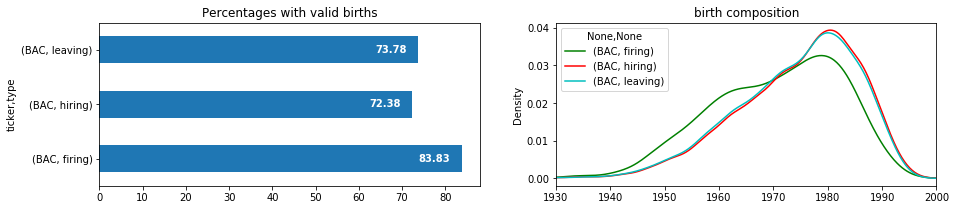

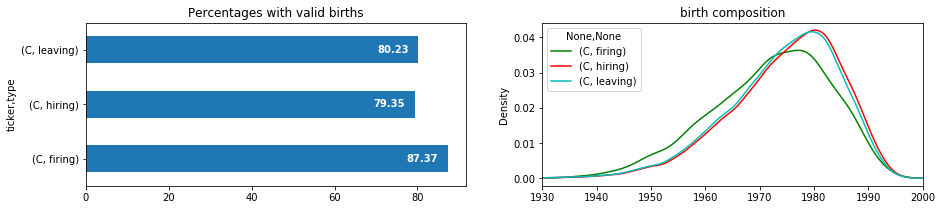

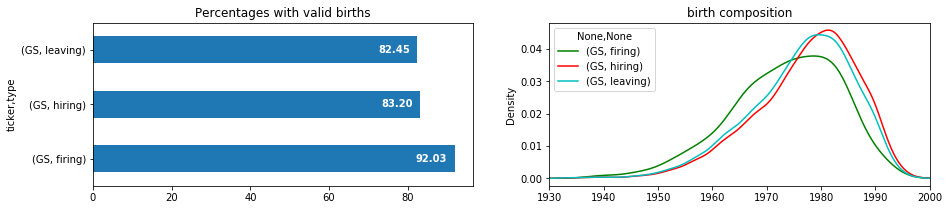

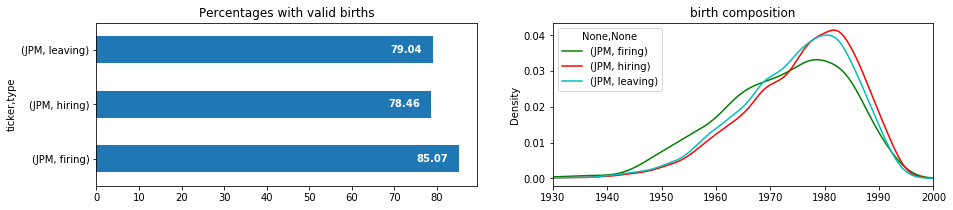

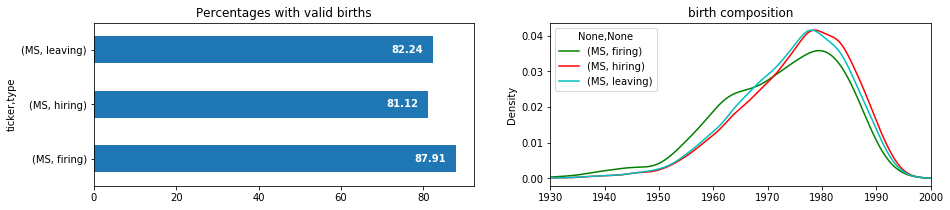

...

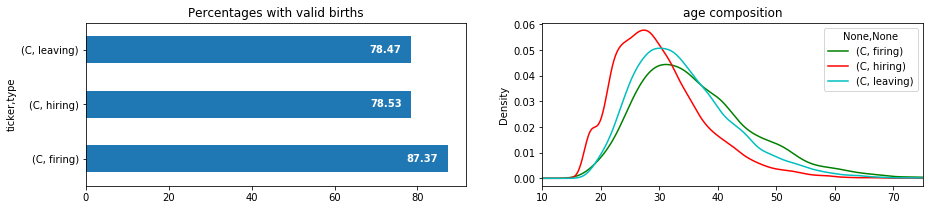

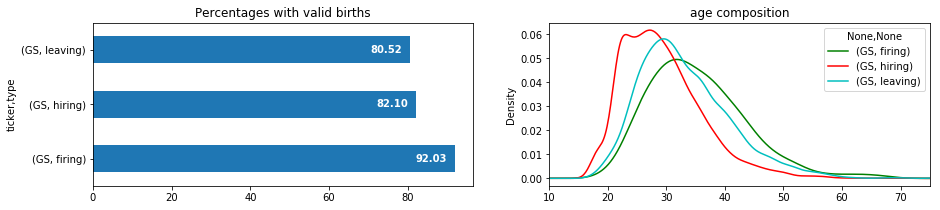

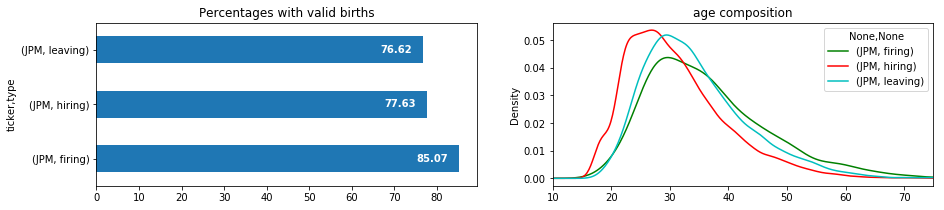

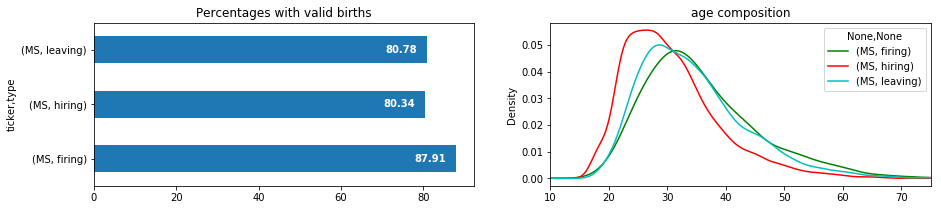

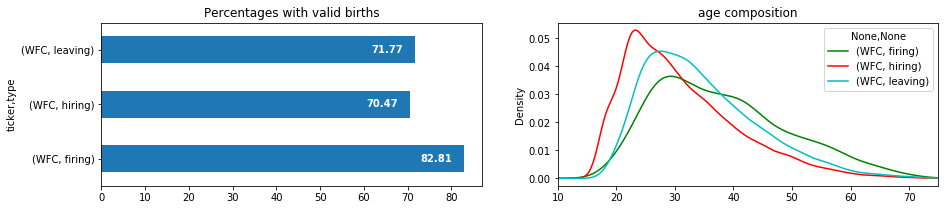

In [16]:
birth_df = empl_changes_df[['ticker','type','year','birth']]
birth_df = birth_df.assign(
    birth = lambda df:df.birth.apply(lambda x:int(x) if x not in ['2000','None'] else np.nan),
    age = lambda df:(df.year-df.birth)
)

# Define a routine to generate plots.
var, xlim = "birth", (1930,2000)
for ticker, grp in birth_df.groupby('ticker'):
    plt.subplots(1,2,figsize=(15,3))
    plt.subplot(121)
    to_plot = grp.groupby(['ticker','type']).apply(lambda df:(df.loc[~df[var].isnull()].size/df.size*100))
    ax = to_plot.plot.barh(title="Percentages with valid births")
    for idx, value in enumerate(to_plot):
        ax.text(value-10,idx-0.05,'{:.2f}'.format(value),color='white',fontweight='bold')
    plt.subplot(122)
    for (idx, group), color in zip(grp.loc[~grp[var].isnull()].groupby(['ticker','type']),color_styles):
        group[var].plot.kde(xlim=xlim,label=idx,title="{} composition".format(var),color=color,legend=True)
    plt.show()
var, xlim = "age", (10,75)
for ticker, grp in birth_df.groupby('ticker'):
    plt.subplots(1,2,figsize=(15,3))
    plt.subplot(121)
    to_plot = grp.groupby(['ticker','type']).apply(lambda df:(df.loc[~df[var].isnull()].size/df.size*100))
    ax = to_plot.plot.barh(title="Percentages with valid births")
    for idx, value in enumerate(to_plot):
        ax.text(value-10,idx-0.05,'{:.2f}'.format(value),color='white',fontweight='bold')
    plt.subplot(122)
    for (idx, group), color in zip(grp.loc[~grp[var].isnull()].groupby(['ticker','type']),color_styles):
        group[var].plot.kde(xlim=xlim,label=idx,title="{} composition".format(var),color=color,legend=True)
    plt.show()

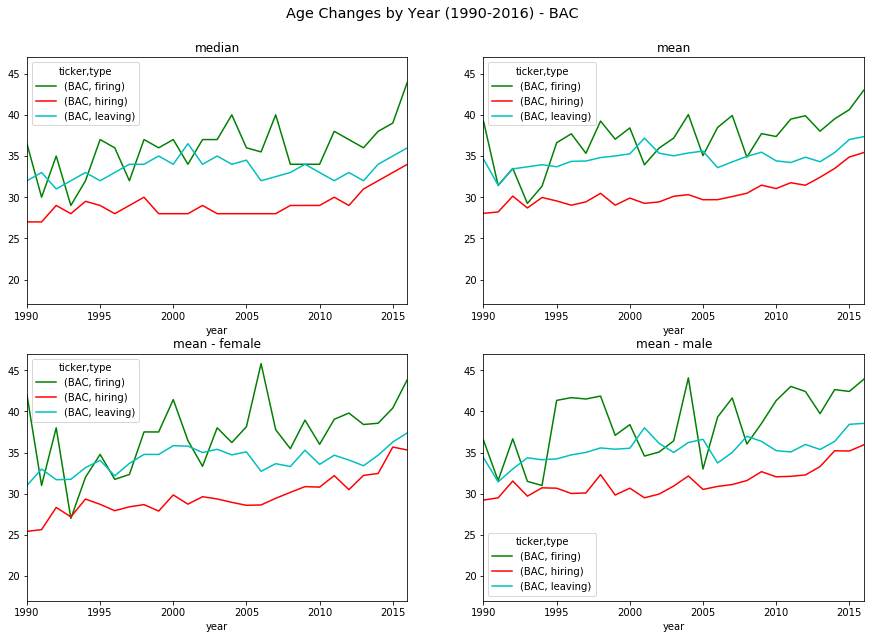

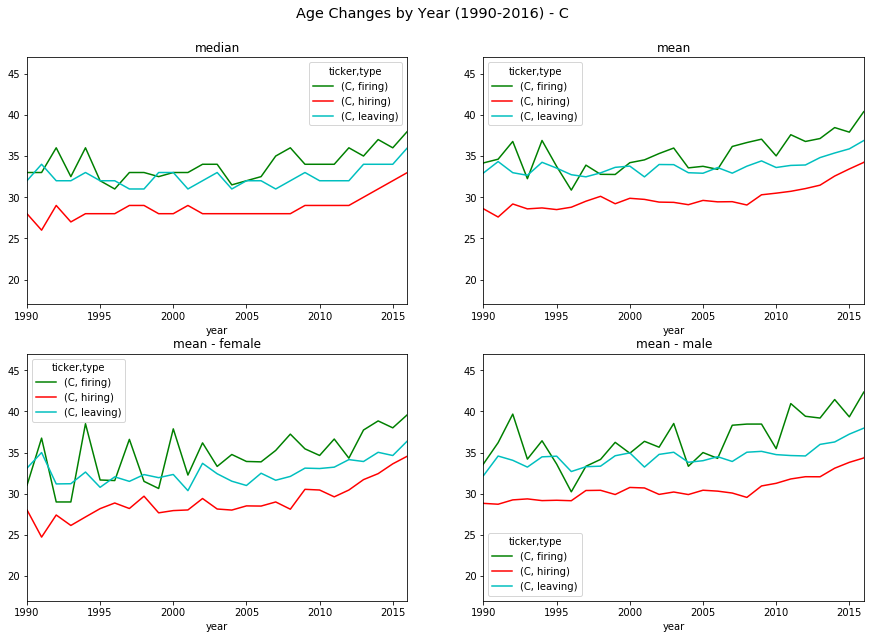

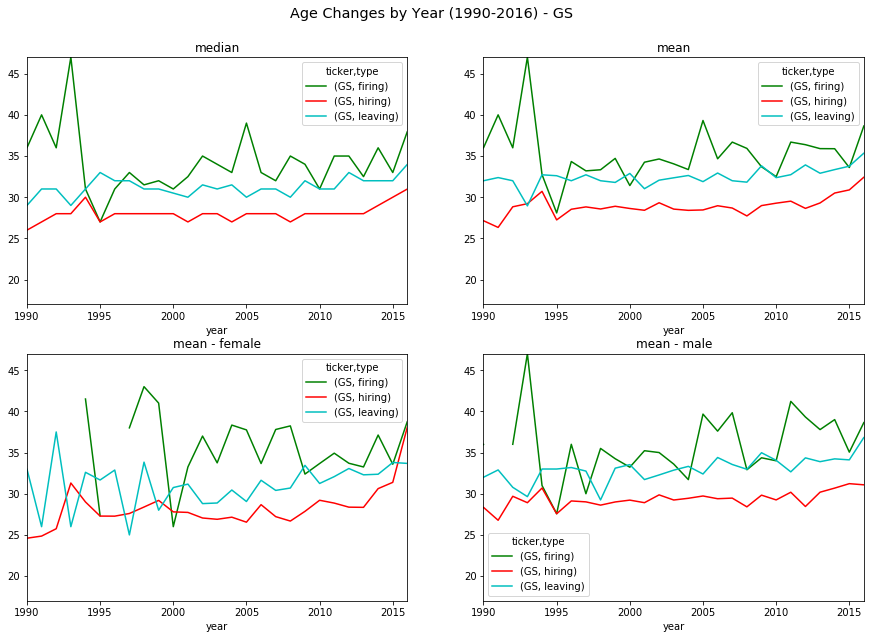

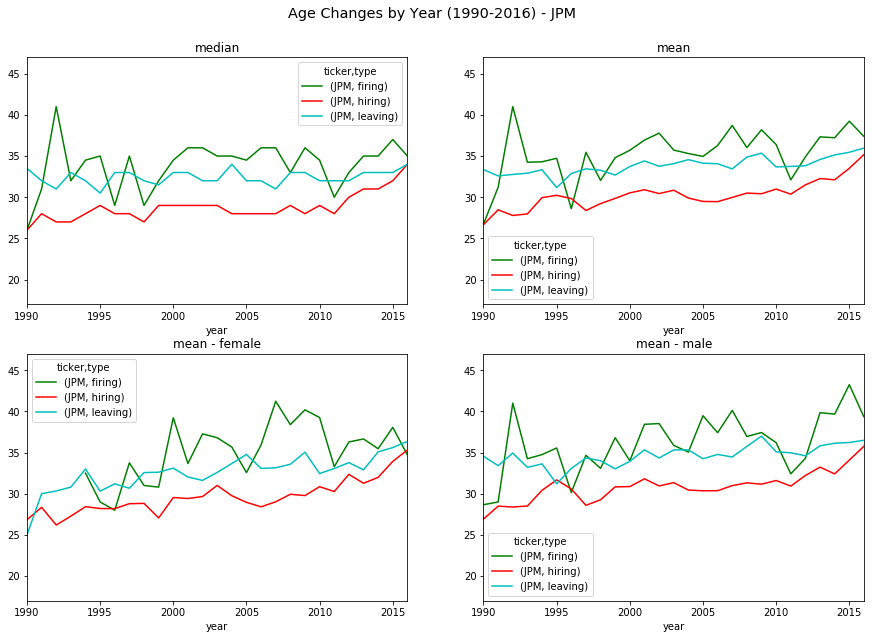

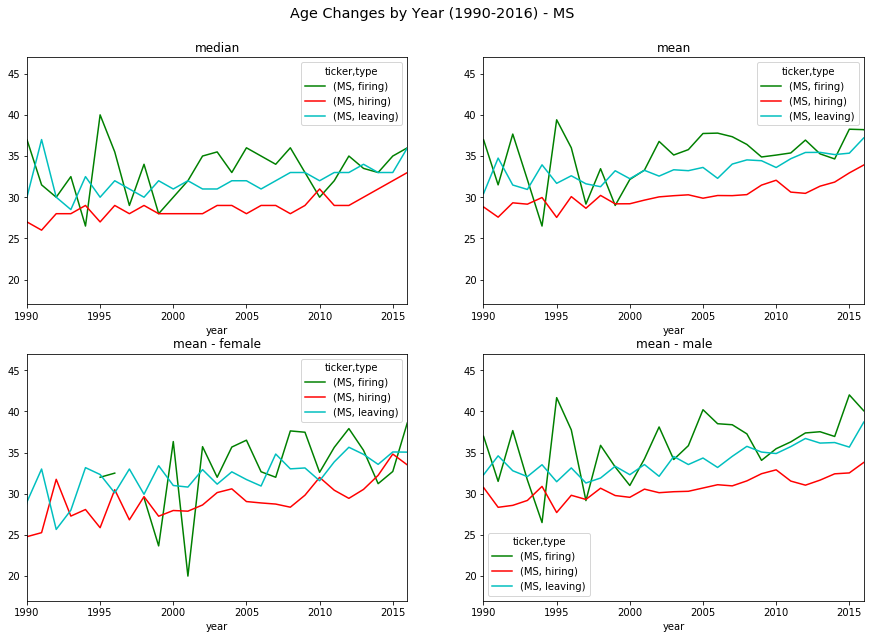

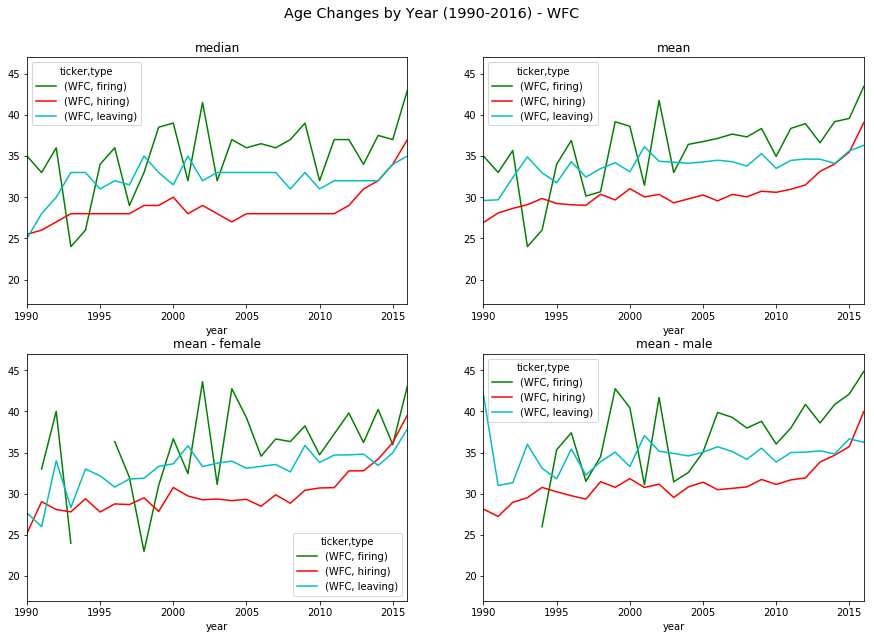

In [17]:
# Age changes by year.
for (ticker, grp) in birth_df.groupby('ticker'):
    fig, ((ax11, ax12), (ax21, ax22))=plt.subplots(2,2,figsize=(15,10))
    fig.suptitle('Age Changes by Year (1990-2016) - {}'.format(ticker),fontsize='x-large',y=0.95)
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='median'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax11,title='median')
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='mean'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax12,title='mean')
    grp.loc[empl_changes_df.gender=='1'].pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='mean'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax21,title='mean - female')
    grp.loc[empl_changes_df.gender=='2'].pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='mean'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax22,title='mean - male')
    plt.show()

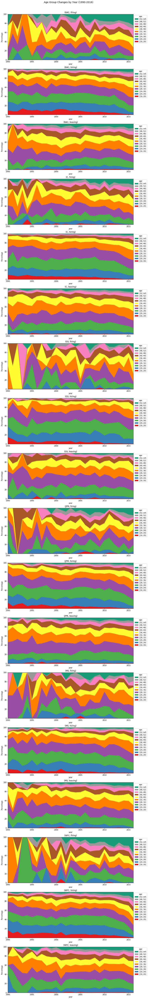

In [18]:
# Age group changes by year.
f_none_hidden = False # Whether to hide the ones out of [16, 52)
bins = list(np.arange(16,55,4))
colormap_unif = list(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)[:len(bins)-1]
if not f_none_hidden:
    bins = [0]+bins+[np.inf]
    colormap_unif = [plt.get_cmap('Dark2').colors[0]]+colormap_unif+[plt.get_cmap('Dark2').colors[0]]

# Plot composition changes by years.
fig, axs = plt.subplots(18,1,figsize=(13.5,108))
fig.suptitle("Age Group Changes by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    birth_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','age']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(count=1).pivot_table(
        index='year', columns=pd.cut(grp.age, bins, right=False, labels=False), values='count', aggfunc='sum', fill_value=0
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, ylim=(0,100), title=str(idx).replace("'",""),xlim=(1990,2016),
        color=[colormap_unif[int(float(i))] for i in to_plot.columns],
        xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), ["[{}, {})".format(bins[int(float(x))], bins[int(float(x))+1]) for x in reversed(labels)], 
        loc='upper left',bbox_to_anchor=(1,1),title='age'
    )
plt.show()

### For those hired in the age of 20-24.

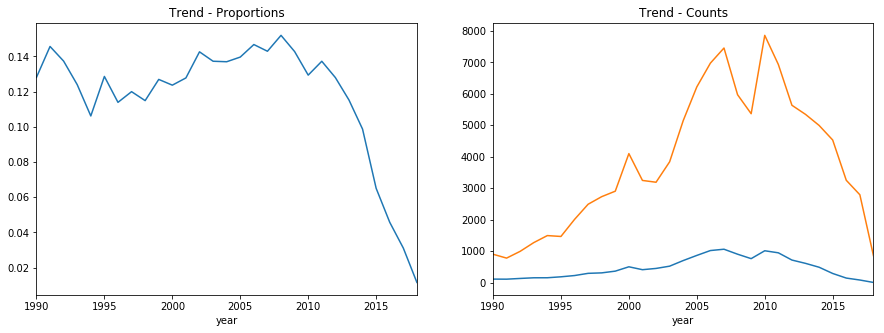

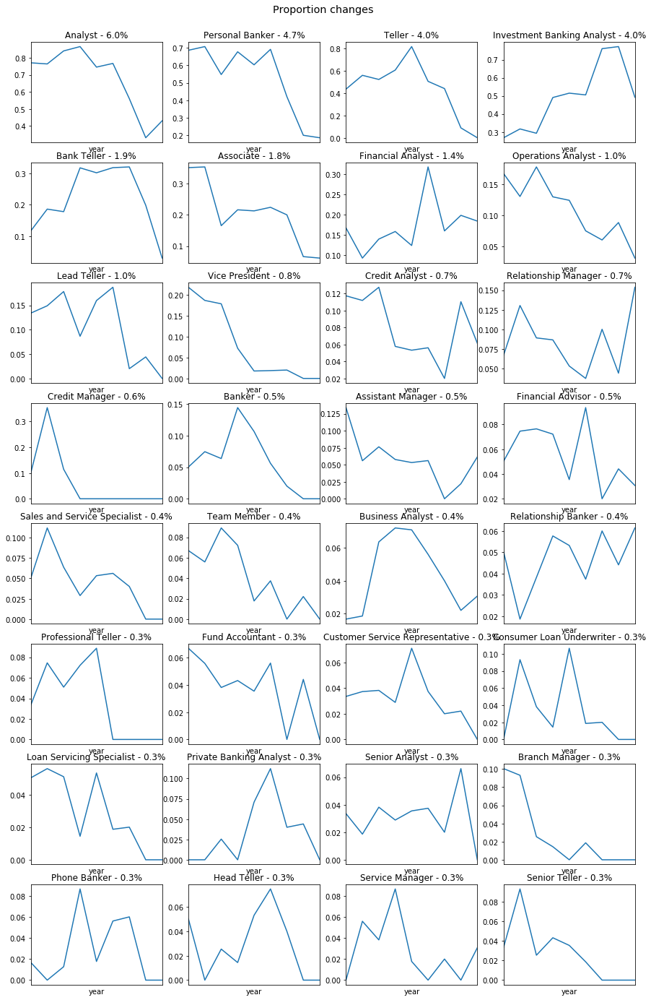

<IPython.core.display.Math object>

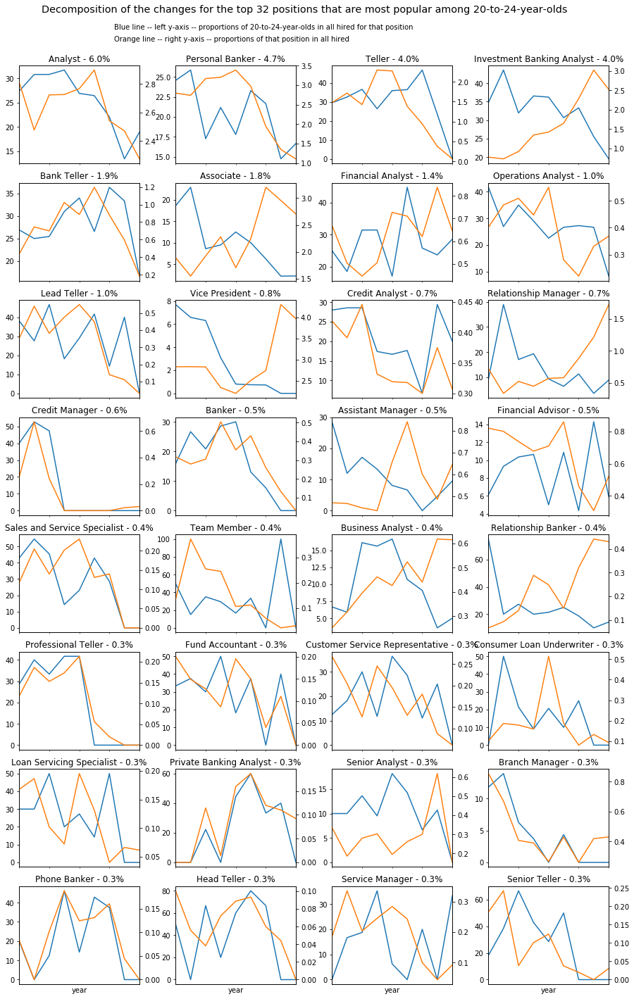

We calculate their contribution using the top 100 positions:

- The actual decrease of average prop_t is 3.7%.

- Assume that PosProp_t does not change, the decrease will be 3.6%.

- Assume that Prop_t does not change, the decrease will be 1.2%.

In [214]:
data_interesting = empl_changes_df[lambda df:(df.type=="hiring")&(df.year>=1990)].assign(
    mark=lambda df:df.assign(
        birth = lambda df:df.birth.apply(lambda x:int(x) if x not in ['2000','None'] else np.nan),
        age = lambda df:(df.year-df.birth)
    ).age.apply(lambda x:20<=x<24)
)
display(HTML("First, we plot the proportions of 20-to-24-year-olds in all the hired:"))
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(15,5))
data_interesting.groupby('year').apply(lambda df: df[df.mark].shape[0]/df.shape[0]).plot(title="Trend - Proportions",ax=ax1)
data_interesting.groupby('year').apply(lambda df: df[df.mark].shape[0]).plot(title="Trend - Counts",ax=ax2)
data_interesting.groupby('year').apply(lambda df: df.shape[0]).plot(ax=ax2)
plt.show()
display(HTML("Thus, in order to investigate the decrease, we should mainly focus on the years from 2008 to 2016."))
data_interesting=data_interesting[lambda df:df.year.apply(lambda x:2008<=x<=2016)]
data_interesting=data_interesting.assign(
    job_title=lambda df:df.job_role.apply(lambda x:x.split(',')[0])
)
# Job titles.
N = data_interesting[lambda df:df.mark].shape[0]
job_title_ser = data_interesting[lambda df:df.mark].groupby('job_title').size().sort_values(ascending=False).head(32)
job_title_dict = {idx: "{} - {:.1f}%".format(idx, (value/N)*100) for idx, value in job_title_ser.iteritems()}
job_title_to_plot = job_title_ser.index
## Proportions in all hired for the same position.
to_plot_1 = data_interesting.set_index('job_title').loc[job_title_to_plot].groupby(['job_title','year']).apply(
    lambda df: df[df.mark].shape[0]/df.shape[0]).rename("prop").reset_index().pivot_table(
    columns="job_title", index="year", values="prop", fill_value=0
)[job_title_to_plot]*100
## Proportions of positions hired.
all_hired = data_interesting.groupby('year').apply(lambda df: df.shape[0])
to_plot_2 = data_interesting.set_index('job_title').loc[job_title_to_plot].groupby(['job_title','year']).apply(
    lambda df: df.shape[0]
).rename("pos").reset_index().pivot_table(
    columns="job_title", index="year", values="pos", fill_value=0
)[job_title_to_plot].div(all_hired, axis='index')*100
## Table.
to_plot = to_plot_1*to_plot_2/100
fig, axs = plt.subplots(8,4,figsize=(15,24))
fig.suptitle("Proportion changes", fontsize="x-large", y=0.91)
for (job_title, ser), ax in zip(to_plot.iteritems(), itertools.chain.from_iterable(axs)):
    ser.plot(ax=ax, xticks=[], title=job_title_dict[job_title])
plt.show()
## Prepare subplots.
display(HTML("Here we decomposite the changes according to the following equation:"))
display(Math(r"""
    {\bar{\mathrm{Prop}}_t}=\frac{\sum_i\mathrm{Position}_{t,i}\times\mathrm{Prop}_{t,i}}{\sum_i\mathrm{Position}_{t,i}}
    =\sum_i\mathrm{PosProp}_{i,t}\times\mathrm{Prop}_{i,t}
"""))
fig, axs = plt.subplots(8,4,figsize=(15,24))
fig.subplots_adjust(wspace = .3)
fig.suptitle(
    "Decomposition of the changes for the top 32 positions that are most popular among 20-to-24-year-olds"
    , fontsize="x-large", y=0.93
)
fig.text(0.25,0.91,"Blue line -- left y-axis -- proportions of 20-to-24-year-olds in all hired for that position")
fig.text(0.25,0.9,"Orange line -- right y-axis -- proportions of that position in all hired")
for (job_title, ser), ax in zip(to_plot_1.iteritems(), itertools.chain.from_iterable(axs)):
    ser.plot(title=job_title_dict[job_title], ax=ax, xticks=[])
for (job_title, ser), ax in zip(to_plot_2.iteritems(), itertools.chain.from_iterable(axs)):
    ser.plot(ax=ax, xticks=[], secondary_y=True)
plt.show()
## Calculate indices.
N = data_interesting[lambda df:df.mark].shape[0]
job_title_ser = data_interesting[lambda df:df.mark].groupby('job_title').size().sort_values(ascending=False).head(100)
job_title_dict = {idx: "{} - {:.1f}%".format(idx, (value/N)*100) for idx, value in job_title_ser.iteritems()}
job_title_to_plot = job_title_ser.index
data_simplified = data_interesting.assign(
    period=lambda df:-(df.year<=2011).astype(int)+(df.year>=2016).astype(int)
).loc[lambda df:(df.period!=0)]
to_plot_1_simp = data_simplified.set_index('job_title').loc[job_title_to_plot].groupby(['job_title','period']).apply(
    lambda df: df[df.mark].shape[0]/df.shape[0]).rename("prop").reset_index().pivot_table(
    columns="job_title", index="period", values="prop"
)[job_title_to_plot]*100
to_plot_1_simp = to_plot_1_simp.fillna(axis=1, method='ffill')
all_hired = data_simplified.groupby('period').apply(lambda df: df.shape[0])
to_plot_2_simp = data_simplified.set_index('job_title').loc[job_title_to_plot].groupby(['job_title','period']).apply(
    lambda df: df.shape[0]
).rename("pos").reset_index().pivot_table(
    columns="job_title", index="period", values="pos", fill_value=0
)[job_title_to_plot].div(all_hired, axis='index')*100
display(Markdown("We calculate their contribution using the top 100 positions:"))
display(Markdown("- The actual decrease of average prop_t is {:.1f}%.".format((to_plot_1_simp*to_plot_2_simp/100).sum(axis=1).dot([1,-1]))))
display(Markdown("- Assume that PosProp_t does not change, the decrease will be {:.1f}%.".format((to_plot_1_simp*to_plot_2_simp.loc[-1]/100).sum(axis=1).dot([1,-1]))))
display(Markdown("- Assume that Prop_t does not change, the decrease will be {:.1f}%.".format((to_plot_1_simp.loc[-1]*to_plot_2_simp/100).sum(axis=1).dot([1,-1]))))

## By Gender.

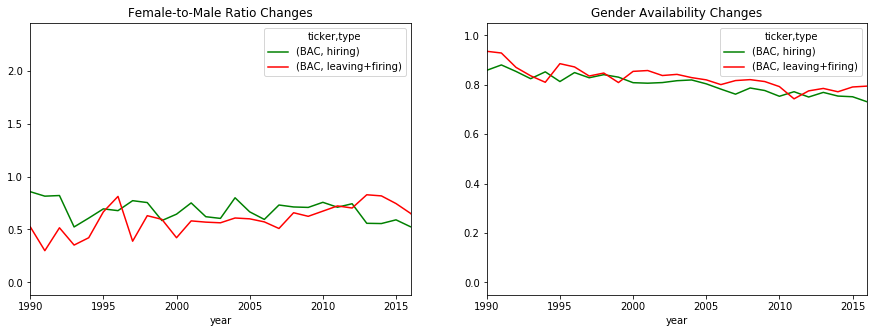

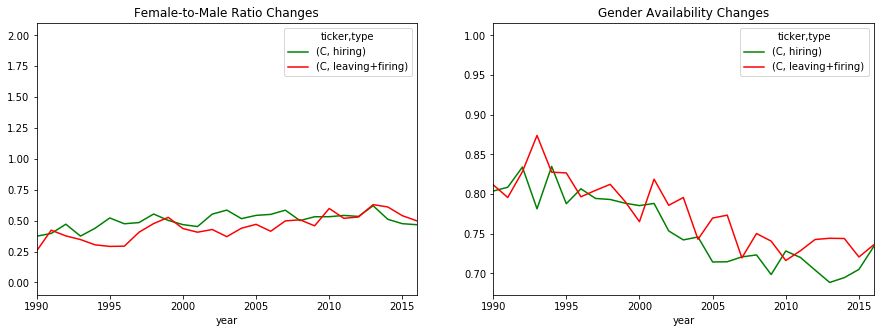

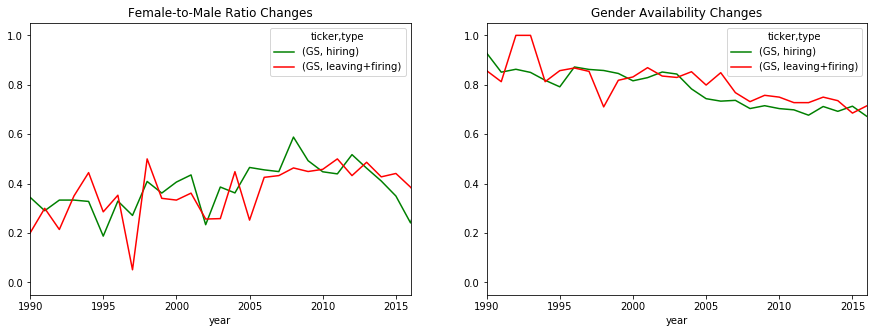

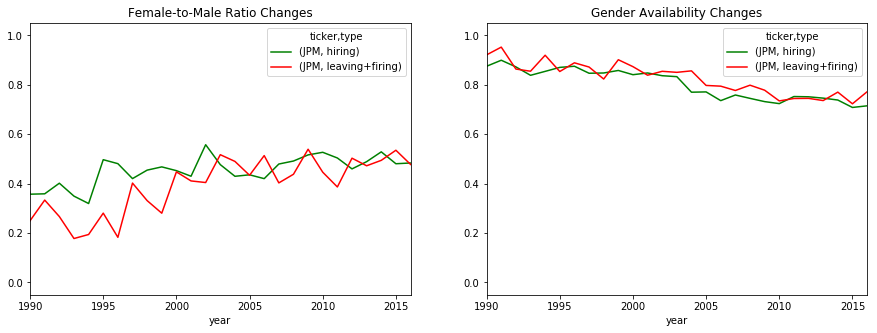

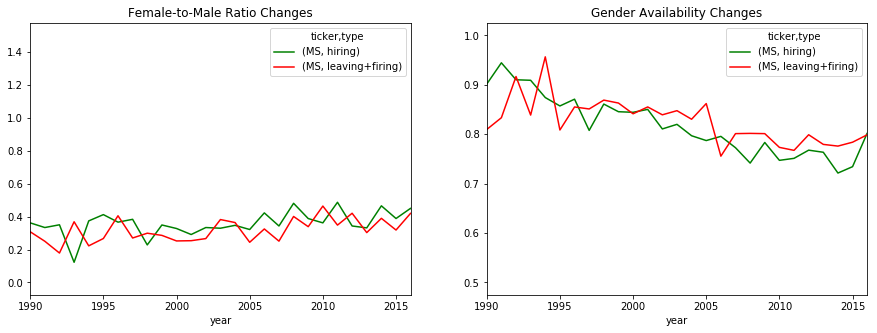

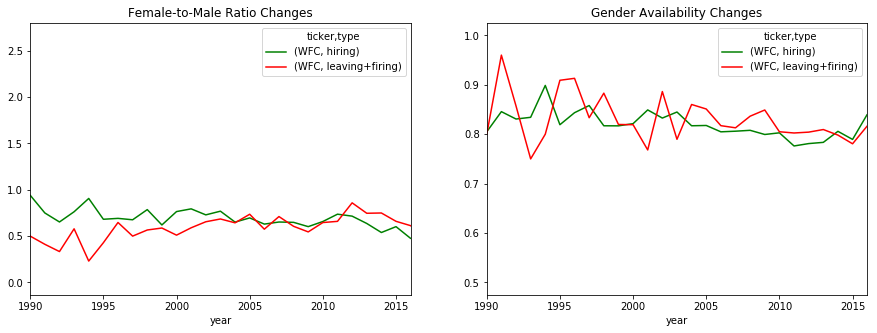

In [19]:
for ticker, grp in empl_changes_df.replace(
        to_replace={"type":{"firing":"leaving+firing","leaving":"leaving+firing"}}
).groupby('ticker'):
    fig, (ax1, ax2)=plt.subplots(1,2,figsize=(15,5))
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='gender',
        aggfunc=lambda x:((x=='1').sum()/(x=='2').sum() if (x=='2').sum() else np.nan)
    ).plot(
        xlim=(1990,2016),color=color_styles,title="Female-to-Male Ratio Changes",ax=ax1,
        xticks=[1990+5*x for x in range(6)]
    )
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='gender',
        aggfunc=lambda x:((x!='0').sum()/x.size)
    ).plot(
        xlim=(1990,2016),color=color_styles,title="Gender Availability Changes",ax=ax2,
        xticks=[1990+5*x for x in range(6)]
    )
    plt.show()

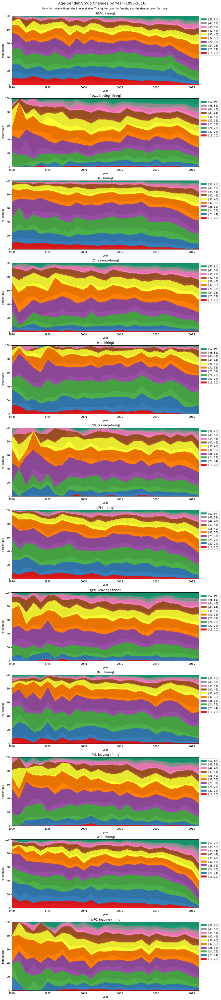

In [20]:
# Age group changes by year.
f_none_hidden = False # Whether to hide the ones out of [16, 52)
bins = list(np.arange(16,55,4))
colormap_unif = list(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)[:len(bins)-1]
if not f_none_hidden:
    bins = [0]+bins+[np.inf]
    colormap_unif = [plt.get_cmap('Dark2').colors[0]]+colormap_unif+[plt.get_cmap('Dark2').colors[0]]

# Plot composition changes by years.
fig, axs = plt.subplots(12,1,figsize=(13.5,72))
fig.suptitle("Age-Gender Group Changes by Year (1990-2016)", fontsize='x-large', y=0.891)
fig.text(0.25,0.885,
         "Only for those with gender info available. The lighter color for female, and the deeper color for male.")
for (idx, grp), ax in zip(
    birth_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016)&(empl_changes_df.gender!='0'), ['ticker','type','year','age']
    ].replace(
        to_replace={"type":{"firing":"leaving+firing","leaving":"leaving+firing"}}
    ).groupby(['ticker','type']), axs
):
    to_plot = grp.assign(count=1).pivot_table(
        index='year', columns=[pd.cut(grp.age, bins, right=False, labels=False), empl_changes_df.gender], 
        values='count', aggfunc='sum', fill_value=0
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, ylim=(0,100), title=str(idx).replace("'",""), 
        xlim=(1990,2016), xticks=[1990+5*x for x in range(6)],
        color=[
            colormap_unif[int(float(i))] if j=='1' else tuple(t/1.1 for t in colormap_unif[int(float(i))]) 
            for i,j in to_plot.columns
        ]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed([handles[i] for i in range(len(handles)) if i%2==0]), 
        reversed(["[{}, {})".format(bins[int(float(x))], bins[int(float(x))+1]) for x in
            [re.match(r"\((\d+)\.0",labels[i]).group(1) for i in range(len(labels)) if i%2==0]
        ]), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

## By Primary Skill.
Different from other parts of this report, this analysis is not restriced to those with "Banking and Finance" as their primary skillset.

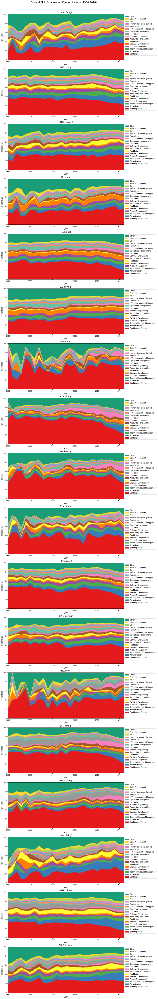

In [21]:
skill1_to_plot = empl_changes_df_0.loc[lambda df:df.skill1!='']

# Create a uniform colormap for all subplots.
skill1_ord_unif = skill1_to_plot.groupby('skill1').size().sort_values(ascending=False).index.tolist()
colormap_unif = {idx:clr for idx, clr in zip(
    skill1_ord_unif,
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif['Others'] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# fig.suptitle("Secondary Skill Composition",fontsize='x-large')
# for (idx,col),ax in zip(
#     skill1_to_plot.loc[:].pivot_table(
#         index='skill1',columns=['ticker','type'],values='gender',aggfunc='count'
#     ).iteritems(), itertools.chain.from_iterable(axs)
# ):
#     to_plot0 = col.sort_values(ascending=False)
#     to_plot = to_plot0.iloc[0:18]
#     to_plot.loc['Others']=to_plot0.sum()-to_plot.sum()  
#     ax=to_plot.plot.pie(
#         ax=ax,labeldistance=1.05,title=str(idx).replace("'",''),autopct='%.2f',pctdistance=0.9,
#         colors = [colormap_unif[idx] for idx in to_plot.index]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
N_cats = 15 # Number of categories to be shown.

# Plot composition changes by years.
fig, axs = plt.subplots(18,1,figsize=(12.5,108))
fig.suptitle("Second Skill Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    skill1_to_plot.loc[lambda df:df.skill1!=''].loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','skill1']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(
        skill1_id = lambda df:[
            {val:(idx if idx<N_cats else N_cats) for idx, val in enumerate(skill1_ord_unif)}[x] for x in df.skill1
        ], count = 1
    ).pivot_table(
        index='year', columns='skill1_id', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.columns = [skill1_ord_unif[i] if i<N_cats else "Others" for i in to_plot.columns]
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""), 
        xlim=(1990,2016), xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), reversed(['\n'.join(wrap(x,30)) for x in labels]), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

In [22]:
edu_lablst = {
    0:"None/Unknown", 1:"High school", 2:"Vocational degree", 3:"Associates", 
    4:"Bachelors", 5:"Masters excl. MBA", 6:"MBA", 7:"Doctorate (PhD/JD/MD)"
}

# Find representative profiles.
for i in range(5):
    display(HTML("<strong>"+skill1_ord_unif[i]+"</strong>"))
    to_plot = skill1_to_plot.assign(edu=lambda df:df.edu.apply(lambda x:edu_lablst[int(x)])).loc[
        lambda df:(df.skill1==skill1_ord_unif[i]),
        ["job_role","depmt","edu","f_elite"]
    ]
    N = to_plot.shape[0]
    # Job role.
    varname = "job_role"
    top10_job_role = pd.DataFrame([v
        for w in to_plot.groupby(varname).size().reset_index().apply(
        lambda x:[[x[varname].split(',')[0].title(),x[0]]]
        #lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N*100).apply(round,ndigits=2)
    ).reset_index(drop=True)#.drop("count",axis=1)
    # Department.
    varname = "depmt"
    to_plot_depmt = to_plot.loc[lambda df:df[varname]!='']
    N_depmt = to_plot_depmt.shape[0]
    top10_depmt = pd.DataFrame([v
        for w in to_plot_depmt.groupby(varname).size().reset_index().apply(
        lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).replace(
        {varname:{"Tehnology":"Technology"}}
    ).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N_depmt*100).apply(round,ndigits=2)
    ).reset_index(drop=True).drop("count",axis=1)
    # Education.
    top10_edu = to_plot.groupby("edu").size().sort_values(ascending=False).apply(
        lambda x:round(x/N*100,2)).rename("prop").reset_index()
    # show.
    display(HTML("<em>Top 10 entries for each variables with proportions:</em>"))
    display(pd.concat([top10_job_role,top10_depmt,top10_edu], axis=1))
    # Some examples.
    to_plot = to_plot.sample(30).assign(
        job_role=lambda df:df.job_role.apply(lambda x:x.split(",")[0])
    )
    display(HTML("<em>Some examples:</em>"))
    display(to_plot)
    

,job_role,count,prop,depmt,prop,edu,prop
0,Vice President,8926,4.28,Accounting,43.00,Bachelors,44.64
1,Analyst,4909,2.35,Oversight,17.67,None/Unknown,21.57
2,Associate,4411,2.11,Marketing,14.26,MBA,15.58
3,Personal Banker,4087,1.96,Operations,7.95,Masters excl. MBA,11.41
4,Managing Director,2772,1.33,Business,7.63,Doctorate (PhD/JD/MD),2.68
5,Executive Director,2763,1.32,Technology,4.60,Associates,2.04
6,Teller,2136,1.02,Hr,3.05,High school,1.60
7,Branch Manager,1790,0.86,Legal,0.78,Vocational degree,0.48
8,Director,1769,0.85,Production,0.78,NaN,NaN
9,Investment Banking Analyst,1730,0.83,Management,0.28,NaN,NaN


,job_role,depmt,edu,f_elite
359824,Operations Analyst,OPERATIONS,Masters excl. MBA,False
363881,Commercial Loan Underwriter,"ACCOUNTING,BUSINESS",None/Unknown,False
416356,Assistant Branch Manager,,None/Unknown,False
476713,Portfolio Associate,,MBA,False
404566,Associate Director,OVERSIGHT,Bachelors,True
374703,Private Banking Analyst,ACCOUNTING,Bachelors,False
427033,Analyst,,Bachelors,False
194056,Compliance Analyst,OVERSIGHT,MBA,False
470831,Mutual Funds Specialist,,Masters excl. MBA,False
342926,Customer Service Supervisor,MARKETING,None/Unknown,False


,job_role,count,prop,depmt,prop,edu,prop
0,Teller,3235,5.79,Accounting,43.59,Bachelors,54.46
1,Bank Teller,2891,5.17,Marketing,25.68,None/Unknown,19.39
2,Personal Banker,1733,3.10,Operations,11.33,Associates,7.80
3,Customer Service Representative,1088,1.95,Hr,5.19,Masters excl. MBA,7.21
4,Executive Assistant,892,1.60,Oversight,5.16,High school,5.46
5,Administrative Assistant,842,1.51,Business,3.49,MBA,3.22
6,Analyst,712,1.27,Technology,3.12,Vocational degree,1.55
7,Lead Teller,660,1.18,Production,1.11,Doctorate (PhD/JD/MD),0.91
8,Financial Analyst,422,0.75,Legal,1.10,NaN,NaN
9,Operations Analyst,344,0.62,Management,0.23,NaN,NaN


,job_role,depmt,edu,f_elite
541073,Administrative Assistant,,Bachelors,False
140306,Service Officer,MARKETING,None/Unknown,False
326209,Administrative Assistant - Equity Capital Markets,ACCOUNTING,Bachelors,False
70459,Accounting Specialist,ACCOUNTING,Associates,False
354416,Financial Analyst,ACCOUNTING,None/Unknown,False
360837,Sophomore Development Fellow,,Bachelors,True
404322,KYC Officer,,Bachelors,False
299039,QA Analyst / Presentation Specialist / Technic...,PRODUCTION,Bachelors,False
64913,Relationship Banker,,Bachelors,False
427771,Finance division,ACCOUNTING,Bachelors,False


,job_role,count,prop,depmt,prop,edu,prop
0,Business Analyst,931,2.58,Technology,45.77,Bachelors,49.94
1,Vice President,846,2.34,Accounting,10.99,None/Unknown,22.03
2,Consultant,793,2.19,Business,9.12,Masters excl. MBA,14.59
3,Project Manager,584,1.62,Marketing,9.04,MBA,8.58
4,Associate,501,1.39,Operations,8.18,Associates,1.78
5,Analyst,321,0.89,Production,6.37,Doctorate (PhD/JD/MD),1.50
6,Business Systems Consultant,300,0.83,Oversight,5.48,High school,1.11
7,Assistant Vice President,286,0.79,Hr,2.75,Vocational degree,0.46
8,Senior Business Analyst,240,0.66,Legal,2.09,NaN,NaN
9,Application Developer,223,0.62,Management,0.21,NaN,NaN


,job_role,depmt,edu,f_elite
274867,Operations Risk Analyst,"OPERATIONS,OVERSIGHT",Masters excl. MBA,False
490620,Business Consultant,,Bachelors,False
441176,VP Sr Architect,,MBA,True
190839,Security Engineer,OPERATIONS,None/Unknown,False
376641,Vice President,,None/Unknown,False
62996,Business Analyst,,None/Unknown,False
8535,Account Manager,,Bachelors,False
470223,Senior Business analyst/ Project Manager,,MBA,False
548400,B2B Integration Architect,TECHNOLOGY,Bachelors,False
474903,IT CONSULTANT/PROJECT MANAGER,TECHNOLOGY,Bachelors,False


,job_role,count,prop,depmt,prop,edu,prop
0,Vice President,477,1.80,Accounting,25.77,Bachelors,47.54
1,Project Manager,407,1.54,Marketing,19.86,None/Unknown,19.92
2,Operations Manager,242,0.92,Operations,19.41,MBA,14.35
3,Personal Banker,232,0.88,Oversight,8.70,Masters excl. MBA,10.70
4,Business Analyst,214,0.81,Technology,8.31,Associates,2.78
5,Customer Service Representative,204,0.77,Business,7.48,High school,2.12
6,Manager,181,0.68,Hr,6.95,Doctorate (PhD/JD/MD),1.91
7,Assistant Vice President,178,0.67,Production,1.87,Vocational degree,0.67
8,Team Leader,170,0.64,Legal,0.95,NaN,NaN
9,Analyst,160,0.61,Management,0.69,NaN,NaN


,job_role,depmt,edu,f_elite
187962,Senior Service Representative,MARKETING,None/Unknown,False
279937,Senior Executive,,MBA,False
140595,Telefonní bankéř senior,,None/Unknown,False
544693,AVP - Packaged Products - Project Manager,BUSINESS,Bachelors,False
385686,Relationship Manager Quality Assurance,PRODUCTION,Bachelors,False
388295,Program Manager,,Bachelors,False
258952,Operations Specialist,OPERATIONS,None/Unknown,False
596224,Customer Service Representative,MARKETING,Bachelors,False
359099,Senior Associate (Finance),ACCOUNTING,Bachelors,False
20292,Loan Officer,ACCOUNTING,None/Unknown,False


,job_role,count,prop,depmt,prop,edu,prop
0,Analyst,547,2.09,Accounting,38.60,Bachelors,46.83
1,Teller,454,1.74,Marketing,25.75,None/Unknown,19.72
2,Personal Banker,443,1.70,Operations,8.56,Masters excl. MBA,13.17
3,Bank Teller,366,1.40,Business,7.72,MBA,13.14
4,Vice President,243,0.93,Oversight,6.42,High school,2.25
5,Investment Banking Analyst,236,0.90,Technology,5.53,Associates,2.12
6,Financial Analyst,210,0.80,Hr,4.71,Doctorate (PhD/JD/MD),1.69
7,Associate,195,0.75,Legal,1.21,Vocational degree,1.08
8,Customer Service Representative,188,0.72,Production,0.88,NaN,NaN
9,Relationship Manager,155,0.59,Management,0.61,NaN,NaN


,job_role,depmt,edu,f_elite
200555,Executive Banking and Credit Card,ACCOUNTING,Bachelors,False
197835,Account Manager,,Bachelors,False
168870,Executive Receptionist,,High school,False
8580,Vice President; Architect 1,,Bachelors,False
227039,Caixa Executivo Operador de Câmbio e Tesoureiro.,,MBA,False
264544,Agent aux Opérations (OPS Accounting-non officer),,None/Unknown,False
241071,Financial Controller & Process analyst,ACCOUNTING,Masters excl. MBA,True
444221,Vice President Institutional Equity Derivatives,,MBA,False
174110,Administrativa- Cajera,,Masters excl. MBA,False
141340,Collections,ACCOUNTING,Associates,False


## By Secondary Skill.

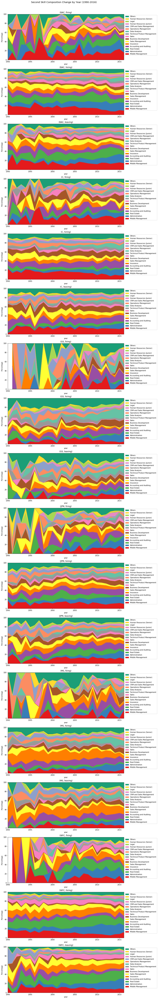

In [23]:
skill2_to_plot = empl_changes_df.loc[lambda df:df.skill2!='']

# Create a uniform colormap for all subplots.
skill2_ord_unif = skill2_to_plot.groupby('skill2').size().sort_values(ascending=False).index.tolist()
colormap_unif = {idx:clr for idx, clr in zip(
    skill2_ord_unif,
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif['Others'] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# fig.suptitle("Secondary Skill Composition",fontsize='x-large')
# for (idx,col),ax in zip(
#     skill2_to_plot.loc[:].pivot_table(
#         index='skill2',columns=['ticker','type'],values='gender',aggfunc='count'
#     ).iteritems(), itertools.chain.from_iterable(axs)
# ):
#     to_plot0 = col.sort_values(ascending=False)
#     to_plot = to_plot0.iloc[0:18]
#     to_plot.loc['Others']=to_plot0.sum()-to_plot.sum()  
#     ax=to_plot.plot.pie(
#         ax=ax,labeldistance=1.05,title=str(idx).replace("'",''),autopct='%.2f',pctdistance=0.9,
#         colors = [colormap_unif[idx] for idx in to_plot.index]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
N_cats = 15 # Number of categories to be shown.

# Plot composition changes by years.
fig, axs = plt.subplots(18,1,figsize=(12.5,108))
fig.suptitle("Second Skill Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    skill2_to_plot.loc[lambda df:df.skill2!=''].loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','skill2']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(
        skill2_id = lambda df:[
            {val:(idx if idx<N_cats else N_cats) for idx, val in enumerate(skill2_ord_unif)}[x] for x in df.skill2
        ], count = 1
    ).pivot_table(
        index='year', columns='skill2_id', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.columns = [skill2_ord_unif[i] if i<N_cats else "Others" for i in to_plot.columns]
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""), 
        xlim=(1990,2016), xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), reversed(['\n'.join(wrap(x,30)) for x in labels]), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

In [24]:
edu_lablst = {
    0:"None/Unknown", 1:"High school", 2:"Vocational degree", 3:"Associates", 
    4:"Bachelors", 5:"Masters excl. MBA", 6:"MBA", 7:"Doctorate (PhD/JD/MD)"
}

# Find representative profiles.
for i in range(5):
    display(HTML("<strong>"+skill2_ord_unif[i]+"</strong>"))
    to_plot = skill2_to_plot.assign(edu=lambda df:df.edu.apply(lambda x:edu_lablst[int(x)])).loc[
        lambda df:(df.skill2==skill2_ord_unif[i]),
        ["job_role","depmt","edu","f_elite"]
    ]
    N = to_plot.shape[0]
    # Job role.
    varname = "job_role"
    top10_job_role = pd.DataFrame([v
        for w in to_plot.groupby(varname).size().reset_index().apply(
        lambda x:[[x[varname].split(',')[0].title(),x[0]]]
        #lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N*100).apply(round,ndigits=2)
    ).reset_index(drop=True)#.drop("count",axis=1)
    # Department.
    varname = "depmt"
    to_plot_depmt = to_plot.loc[lambda df:df[varname]!='']
    N_depmt = to_plot_depmt.shape[0]
    top10_depmt = pd.DataFrame([v
        for w in to_plot_depmt.groupby(varname).size().reset_index().apply(
        lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).replace(
        {varname:{"Tehnology":"Technology"}}
    ).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N_depmt*100).apply(round,ndigits=2)
    ).reset_index(drop=True).drop("count",axis=1)
    # Education.
    top10_edu = to_plot.groupby("edu").size().sort_values(ascending=False).apply(
        lambda x:round(x/N*100,2)).rename("prop").reset_index()
    # show.
    display(HTML("<em>Top 10 entries for each variables with proportions:</em>"))
    display(pd.concat([top10_job_role,top10_depmt,top10_edu], axis=1))
    # Some examples.
    to_plot = to_plot.sample(30).assign(
        job_role=lambda df:df.job_role.apply(lambda x:x.split(",")[0])
    )
    display(HTML("<em>Some examples:</em>"))
    display(to_plot)
    

,job_role,count,prop,depmt,prop,edu,prop
0,Vice President,452,3.35,Accounting,33.11,Bachelors,43.36
1,Associate,175,1.30,Operations,16.86,None/Unknown,21.42
2,Assistant Manager,122,0.91,Marketing,15.67,MBA,18.13
3,Personal Banker,120,0.89,Oversight,14.47,Masters excl. MBA,9.98
4,Manager,116,0.86,Business,7.64,Associates,2.79
5,Assistant Vice President,109,0.81,Hr,4.99,Doctorate (PhD/JD/MD),1.92
6,Senior Vice President,105,0.78,Technology,3.96,High school,1.88
7,Analyst,104,0.77,Production,1.86,Vocational degree,0.51
8,Branch Manager,90,0.67,Legal,0.84,NaN,NaN
9,Operations Manager,83,0.62,Management,0.60,NaN,NaN


,job_role,depmt,edu,f_elite
150849,Assistant Manager,,Doctorate (PhD/JD/MD),False
614468,Enterprise Controls & Oversight Leader,,MBA,False
318990,Vice President - Securities Operations,OPERATIONS,Bachelors,True
456749,Financial Advisor,ACCOUNTING,Masters excl. MBA,False
365809,Director Recovery Business Controls,OVERSIGHT,Bachelors,False
250281,Vice President - Community Lending Channel,MARKETING,Bachelors,False
374022,Investigation Officer,OVERSIGHT,Masters excl. MBA,False
232802,Vice President,,Bachelors,False
428866,Vice President - Business Management Analytics,BUSINESS,None/Unknown,False
23540,Small Business Banker,,Bachelors,False


,job_role,count,prop,depmt,prop,edu,prop
0,Personal Banker,637,5.13,Accounting,48.48,Bachelors,51.05
1,Teller,563,4.53,Marketing,21.35,None/Unknown,22.67
2,Bank Teller,322,2.59,Operations,11.22,Masters excl. MBA,7.94
3,Analyst,246,1.98,Oversight,7.14,Associates,6.32
4,Lead Teller,187,1.50,Business,4.81,MBA,5.72
5,Investment Banking Analyst,126,1.01,Hr,3.06,High school,4.05
6,Associate,116,0.93,Technology,2.07,Vocational degree,1.24
7,Relationship Manager,112,0.90,Production,0.89,Doctorate (PhD/JD/MD),1.01
8,Branch Manager,112,0.90,Legal,0.87,NaN,NaN
9,Financial Analyst,104,0.84,Management,0.11,NaN,NaN


,job_role,depmt,edu,f_elite
409158,Market Director of Banking,"ACCOUNTING,OVERSIGHT,BUSINESS",None/Unknown,False
260580,Collector II,,None/Unknown,False
2994,AVP Financial Center Manager II,ACCOUNTING,None/Unknown,False
81015,Middle Office Senior Specialist,,Bachelors,False
405578,Associate,,MBA,False
529801,Marketing Manager,MARKETING,Bachelors,False
351165,Licensed Personal Banker,,Bachelors,False
604171,Vice President Financial Center Manager III,ACCOUNTING,Bachelors,True
426135,Registered Marketing Associate,MARKETING,Masters excl. MBA,False
539455,Loan Specialist 4,ACCOUNTING,Doctorate (PhD/JD/MD),False


,job_role,count,prop,depmt,prop,edu,prop
0,Vice President,403,3.32,Accounting,64.60,Bachelors,47.92
1,Personal Banker,236,1.94,Marketing,10.71,None/Unknown,29.66
2,Home Mortgage Consultant,225,1.85,Operations,7.39,MBA,8.94
3,Mortgage Loan Officer,191,1.57,Oversight,6.29,Associates,4.56
4,Underwriter,190,1.56,Business,5.71,Masters excl. MBA,4.45
5,Branch Manager,156,1.28,Production,2.14,High school,2.87
6,Mortgage Underwriter,153,1.26,Hr,1.67,Doctorate (PhD/JD/MD),0.96
7,Loan Officer,121,1.00,Technology,0.95,Vocational degree,0.63
8,Analyst,104,0.86,Legal,0.39,NaN,NaN
9,Associate,104,0.86,Management,0.16,NaN,NaN


,job_role,depmt,edu,f_elite
492778,Lending Manager,,Bachelors,False
56111,HE Executive Manager II,,None/Unknown,False
505171,Vice President- MBS Trader,,Bachelors,False
386015,Mortgage Loan Processor,ACCOUNTING,Masters excl. MBA,False
613916,Vice President Commercial Loan Officer,"ACCOUNTING,BUSINESS",Bachelors,False
335667,Senior Loan Officer,ACCOUNTING,None/Unknown,False
519114,financial analyst,ACCOUNTING,None/Unknown,False
93427,Sr. Retail Sales Processor,MARKETING,MBA,False
103137,Workout Specialist,,Bachelors,False
74372,Mortgage Servicing Team Manager,ACCOUNTING,Bachelors,False


,job_role,count,prop,depmt,prop,edu,prop
0,Vice President,373,3.21,Accounting,54.07,Bachelors,49.13
1,Analyst,258,2.22,Oversight,14.75,MBA,18.80
2,Associate,250,2.15,Operations,9.50,Masters excl. MBA,14.98
3,Financial Analyst,233,2.01,Business,6.95,None/Unknown,13.13
4,Assistant Vice President,106,0.91,Marketing,6.85,Doctorate (PhD/JD/MD),1.59
5,Manager,93,0.80,Hr,2.86,Associates,1.07
6,Personal Banker,91,0.78,Technology,2.84,High school,0.98
7,Assistant Manager,86,0.74,Legal,1.00,Vocational degree,0.32
8,Investment Banking Analyst,78,0.67,Production,0.98,NaN,NaN
9,Credit Analyst,75,0.65,Management,0.20,NaN,NaN


,job_role,depmt,edu,f_elite
211840,Assistant Vice President,,None/Unknown,False
466154,Associate Finance,ACCOUNTING,Bachelors,False
276904,Treasury Sales,"ACCOUNTING,MARKETING",Bachelors,False
434062,Tax Assistant,ACCOUNTING,Bachelors,False
362849,Vice President - Model Governance,OPERATIONS,Doctorate (PhD/JD/MD),False
484071,Phone Banker,,Associates,False
281706,Corporate & Investment Banking Analyst,"ACCOUNTING,BUSINESS",MBA,True
342922,Retail Loan Processor,"MARKETING,ACCOUNTING",Bachelors,False
440126,Analyst - Equity Position Control,,Bachelors,False
421730,Associate - Client Service,MARKETING,Bachelors,False


,job_role,count,prop,depmt,prop,edu,prop
0,Financial Advisor,566,5.38,Accounting,55.59,Bachelors,51.18
1,Vice President,420,3.99,Marketing,15.80,None/Unknown,20.59
2,Personal Banker,349,3.32,Oversight,13.86,MBA,14.98
3,Senior Vice President,149,1.42,Business,5.04,Masters excl. MBA,6.90
4,Managing Director,111,1.05,Operations,4.69,Doctorate (PhD/JD/MD),2.53
5,Teller,94,0.89,Hr,2.85,Associates,2.16
6,Associate,90,0.86,Technology,1.39,High school,1.25
7,Relationship Manager,89,0.85,Legal,0.31,Vocational degree,0.42
8,Branch Manager,88,0.84,Production,0.29,NaN,NaN
9,Private Banker,81,0.77,Management,0.18,NaN,NaN


,job_role,depmt,edu,f_elite
617247,Trading Representative,ACCOUNTING,MBA,False
291320,Equity salesman,,Bachelors,False
472485,Financial Advisor,ACCOUNTING,Associates,False
562631,Alternative Investment Consultant,ACCOUNTING,Bachelors,False
568043,Personal Banker,,Bachelors,False
418160,Associate Client Advisor,,Bachelors,False
265645,First Vice President / Investments,,Bachelors,False
194353,CG RM,,MBA,False
103700,Senior Vice President,,Bachelors,False
135333,Analyst,,Bachelors,True


## By Country.

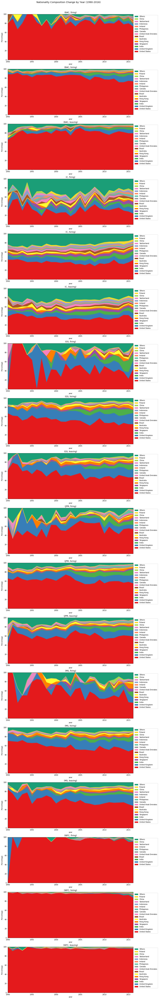

In [25]:
# Create a uniform colormap for all subplots.
cntry_ord_unif = empl_changes_df.groupby('cntry').size().sort_values(ascending=False).index.tolist()
colormap_unif = {idx:clr for idx, clr in zip(
    cntry_ord_unif,
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif['Others'] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# for (idx,col),ax in zip(empl_changes_df.loc[:].pivot_table(
#     index='cntry',columns=['ticker','type'],values='gender',aggfunc='count'
# ).iteritems(),itertools.chain.from_iterable(axs)):
#     to_plot0 = col.sort_values(ascending=False)
#     to_plot = to_plot0.iloc[0:28]
#     to_plot.loc['Others']=to_plot0.sum()-to_plot.sum()  
#     to_plot.plot.pie(
#         ax=ax,labeldistance=1.05,title=str(idx).replace("'",''),autopct='%.2f',pctdistance=0.9,rotatelabels=True,
#         color = [colormap_unif[idx] for idx in to_plot.index]
#     )
#     ax.set_ylabel('')
# plt.show()


## Continued ##
N_cats = 15 # Number of categories to be shown.

# Plot composition changes by years.
fig, axs = plt.subplots(18,1,figsize=(13.5,108))
fig.suptitle("Nationality Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','cntry']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(
        cntry_id = lambda df:[
            {val:(idx if idx<N_cats else N_cats) for idx, val in enumerate(cntry_ord_unif)}[x] for x in df.cntry
        ], count = 1
    ).pivot_table(
        index='year', columns='cntry_id', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.columns = [cntry_ord_unif[i] if i<N_cats else "Others" for i in to_plot.columns]
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""),
        xlim=(1990,2016),xticks=[1990+x*5 for x in range(6)]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), reversed(labels), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

## By Education Level.

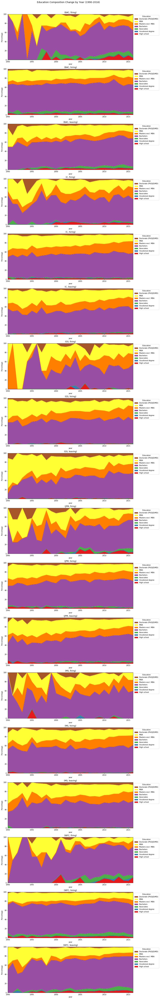

In [26]:
edu_lablst = {
    0:"None/Unknown", 1:"High school", 2:"Vocational degree", 3:"Associates", 
    4:"Bachelors", 5:"Masters excl. MBA", 6:"MBA", 7:"Doctorate (PhD/JD/MD)"
}
colormap_unif = {str(idx):clr for idx, clr in zip(
    range(len(edu_lablst)),
    itertools.cycle([plt.get_cmap('Dark2').colors[0]]+list(plt.get_cmap('Set1').colors))
)}

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# for (idx,col),ax in zip(empl_changes_df.loc[:].pivot_table(
#     index='edu',columns=['ticker','type'],values='gender',aggfunc='count'
# ).iteritems(),itertools.chain.from_iterable(axs)):
#     col.plot.pie(
#         ax=ax, labeldistance=1.05, title=str(idx).replace("'",''), autopct='%.2f', pctdistance=0.9,
#         colors=[colormap_unif[idx] for idx in col.index], labels=[edu_lablst[x] for x in range(0,8)]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
f_none_hidden = True # Whether to show the "None/Unknown"s.

# Plot composition changes by years.
fig, axs = plt.subplots(18,1,figsize=(13.5,108))
fig.suptitle("Education Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','edu']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.loc[lambda df:[int(x)>=f_none_hidden for x in df.edu]].assign(count = 1).pivot_table(
        index='year', columns='edu', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""),
        xlim=(1990,2016), xticks=[1990+x*5 for x in range(6)]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), [edu_lablst[int(x)] for x in reversed(labels)], 
        loc='upper left',bbox_to_anchor=(1,1),title="Education"
    )
plt.show()



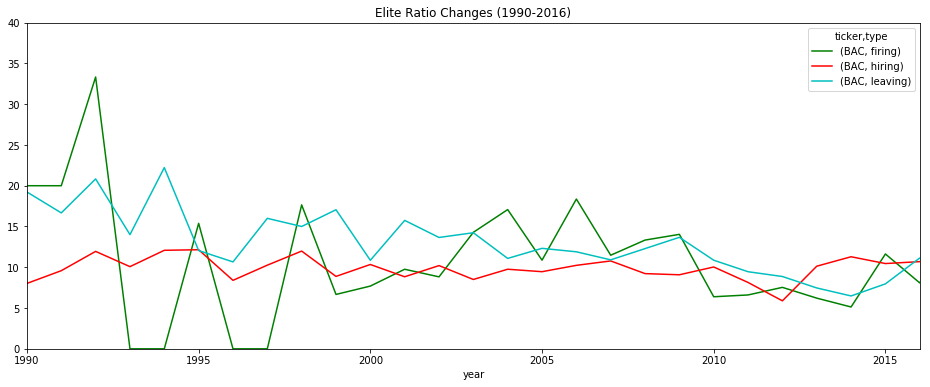

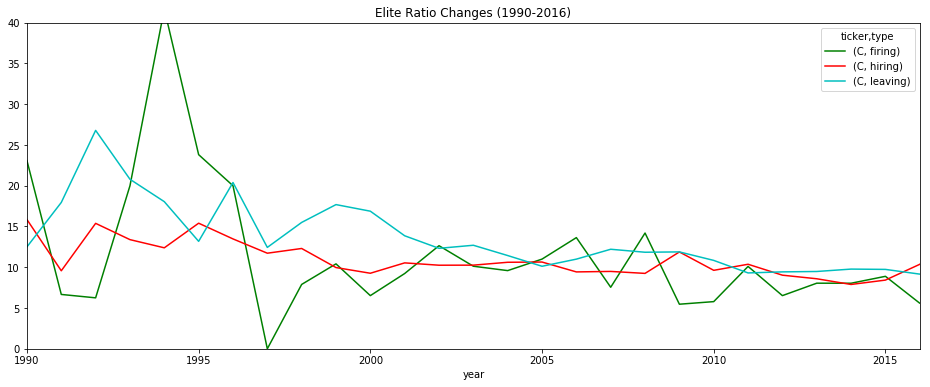

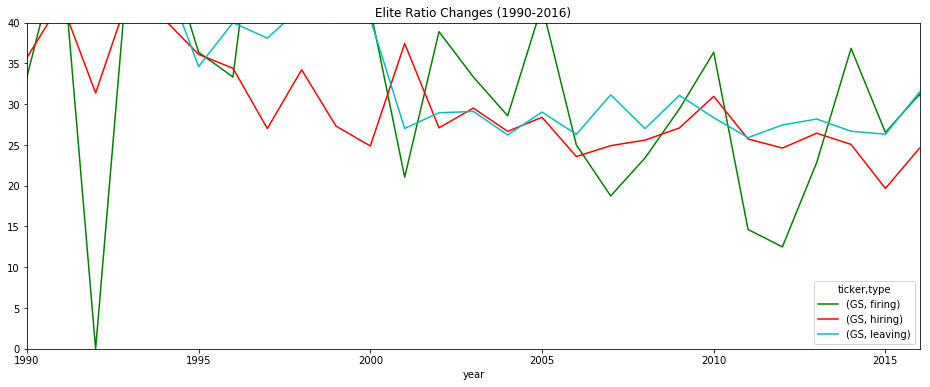

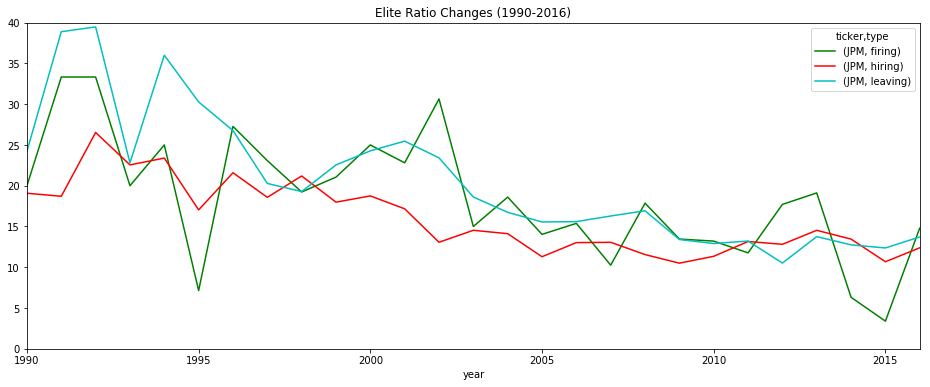

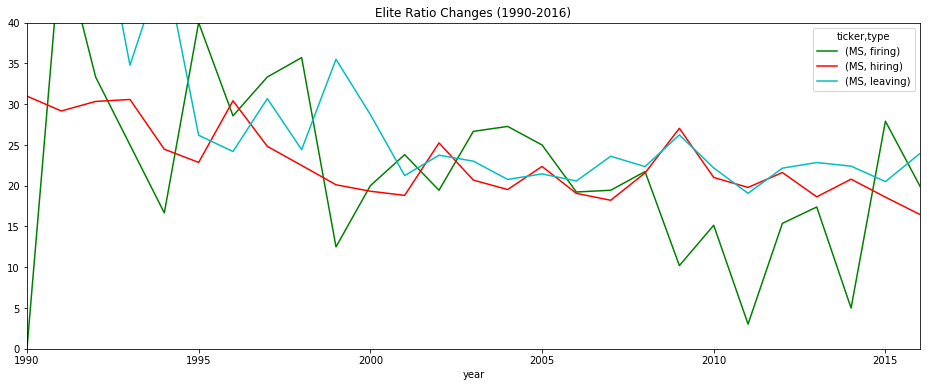

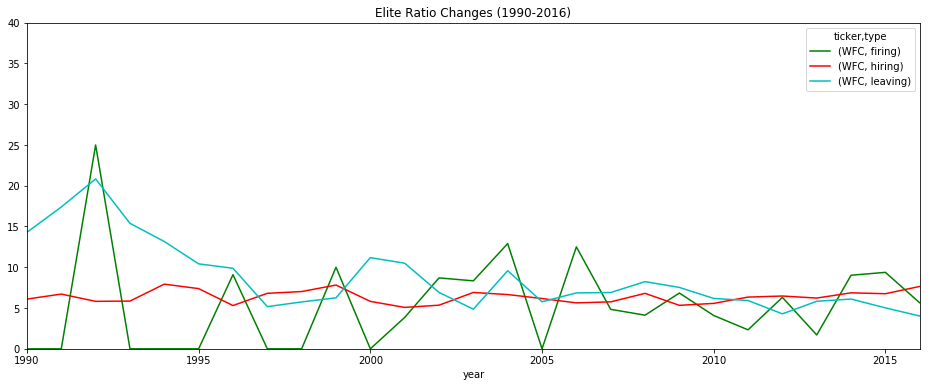

In [27]:
for ticker, grp in empl_changes_df.groupby('ticker'):
    grp.loc[lambda df:df.year>=1990].pivot_table(
        index='year',columns=['ticker','type'],values='f_elite',
        aggfunc=lambda x:((x=='True').sum()/(x==x).sum()*100)
    ).plot(
        xlim=(1990,2016),color=color_styles,ylim=(0,40),
        title="Elite Ratio Changes (1990-2016)",figsize=(16,6)
    )
    ax.set_ylabel('Percentage')
plt.show()

# By Next Industry.

Note: Division of 2-digit NAICS's into industry groups are obtained from [Bureau of Labor Statistics](https://www.bls.gov/iag/tgs/iag_index_naics.htm).

In [28]:
NAICS2GRP_dict = {
    '11': (1, "Natural Resources and Mining"),
    '21': (1, "Natural Resources and Mining"),
    '23': (2, "Construction"),
    '31': (3, "Manufacturing"),
    '32': (3, "Manufacturing"),
    '33': (3, "Manufacturing"),
    '42': (4, "Trade, Transportation, and Utilities"),
    '44': (4, "Trade, Transportation, and Utilities"),
    '45': (4, "Trade, Transportation, and Utilities"),
    '48': (4, "Trade, Transportation, and Utilities"),
    '49': (4, "Trade, Transportation, and Utilities"),
    '22': (4, "Trade, Transportation, and Utilities"),
    '51': (5, "Information"),
    '52': (6, "Financial Activities"),
    '53': (6, "Financial Activities"),
    '54': (7, "Professional and Business Services"),
    '55': (7, "Professional and Business Services"),
    '56': (7, "Professional and Business Services"),
    '61': (8, "Education and Health Services"),
    '62': (8, "Education and Health Services"),
    '71': (9, "Leisure and Hospitality"),
    '72': (9, "Leisure and Hospitality"),
    '81': (10, "Other Services"),
    '92': (11, "Public Administration"),
    '99': (12, "Unknown/Unclassified"),
    ''  : (12, "Unknown/Unclassified"),
    'MI': (12, "Unknown/Unclassified"),
    '46': (12, "Unknown/Unclassified")
}

# Show the mappings.
pd.DataFrame(
    [[key, value[0], value[1]] for key,value in NAICS2GRP_dict.items()]
).groupby([1,2])[0].apply(lambda ser:', '.join(ser)).reset_index().drop(1,axis=1).rename(
    {2:"Industry group",0:"NAICS2"},axis=1
)

,Industry group,NAICS2
0,Natural Resources and Mining,"11, 21"
1,Construction,23
2,Manufacturing,"31, 32, 33"
3,"Trade, Transportation, and Utilities","42, 44, 45, 48, 49, 22"
4,Information,51
5,Financial Activities,"52, 53"
6,Professional and Business Services,"54, 55, 56"
7,Education and Health Services,"61, 62"
8,Leisure and Hospitality,"71, 72"
9,Other Services,81


Note: `46` seems to be a wrong NAICS2 code.

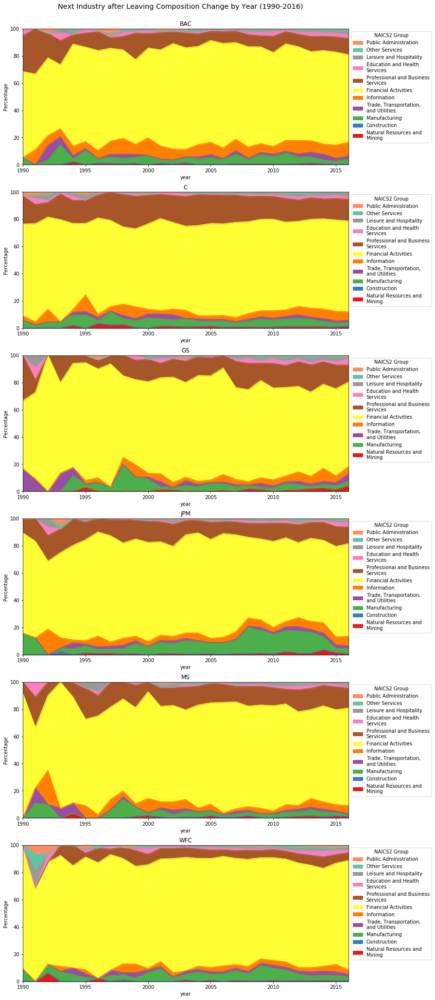

In [29]:
ind_next_lst = sorted(list(set(NAICS2GRP_dict.values())))
colormap_unif = {idx:clr for idx, clr in zip(
    ind_next_lst[:-1], # Assume the last element is "Others".
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif[ind_next_lst[-1]] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(1,2,figsize=(15,7.5))
# for (idx,col),ax in zip(empl_changes_df.loc[lambda df:df.type=='leaving'].pivot_table(
#     index=empl_changes_df.ind_next.apply(lambda x:NAICS2GRP_dict[x[:2]]),
#     columns='ticker', values='gender', aggfunc='count'
# ).iteritems(),axs):
#     col.plot.pie(
#         ax=ax, labeldistance=1.05, title=str(idx).replace("'",''), autopct='%.2f', pctdistance=0.9,
#         colors=[colormap_unif[idx] for idx in col.index], labels=[x[1] for x in col.index]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
f_none_hidden = True # Whether to show the "None/Unknown"s.

# Plot composition changes by years.
fig, axs = plt.subplots(6,1,figsize=(12,36))
fig.suptitle("Next Industry after Leaving Composition Change by Year (1990-2016)", fontsize='x-large', y=0.90)
for (idx, grp), ax in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016)&(df.type=='leaving'), ['ticker','type','year','ind_next']
    ].groupby('ticker'), axs
):
    to_plot = grp.assign(count=1).pivot_table(
        columns=grp.ind_next.apply(lambda x:NAICS2GRP_dict[x[:2]]),
        index='year', values='count', aggfunc='sum', fill_value=0
    )
    if f_none_hidden:
        to_plot.drop(ind_next_lst[-1], axis=1, inplace=True)
    to_plot = to_plot.apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=idx, xlim=(1990,2016), xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), ["\n".join(wrap(re.match(r"\(\d+, (.+)\)",x).group(1),25)) for x in reversed(labels)], 
        loc='upper left', bbox_to_anchor=(1,1), title="NAICS2 Group"
    )
plt.show()

## Tenure and Number of Promotions.

Note:
- Tenure = End date of last entry - Start date of first entry in a consecutive sequence of entries in the same company;
 - When there is any invalid month in the two dates and their years are _not_ the same, the invalid month is replaced by 6;
 - When there is any invalid month in the two dates and their years are the same, the invalid month is assumed to be the extreme value (0 for start and 12 for end) and the results are the minimum of their difference and 6.
- Number of promotions = Number of entries in a consecutive sequence of entries in the same company - 1.

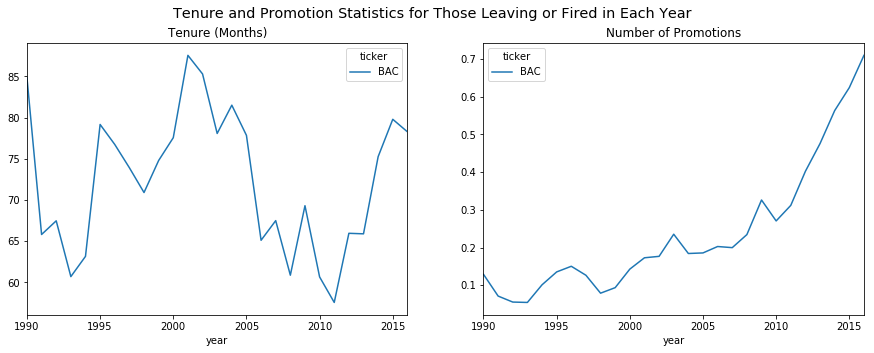

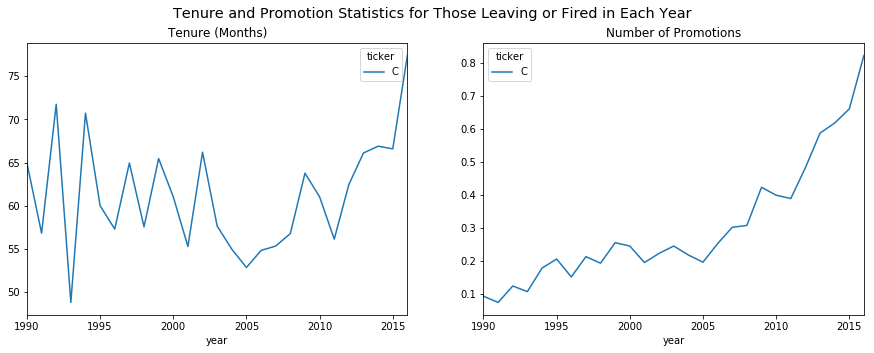

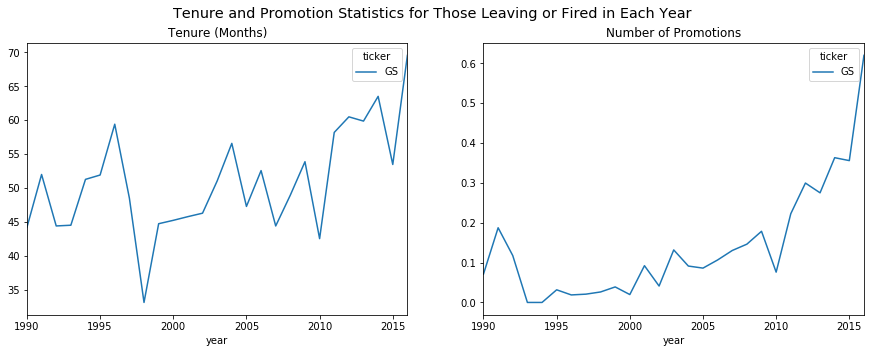

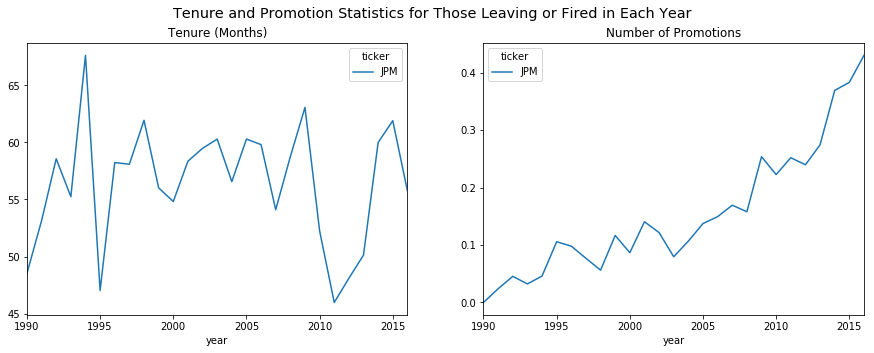

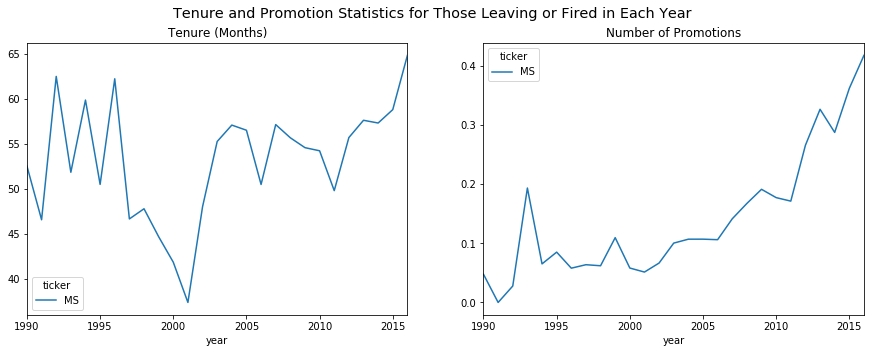

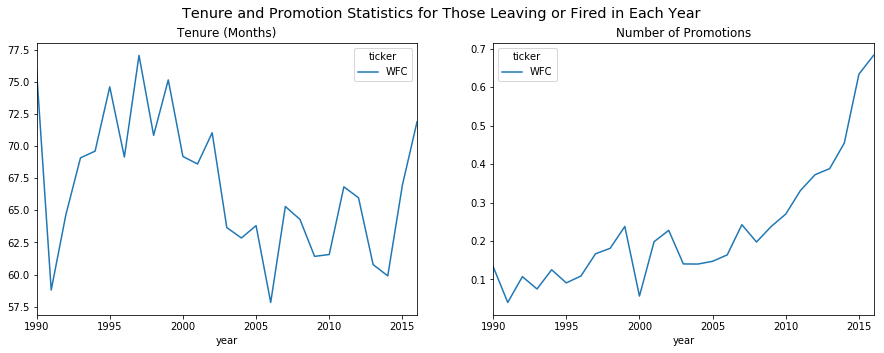

In [30]:
for ticker, grp in empl_changes_df.groupby('ticker'):
    # Calculate.
    to_plot = grp.loc[lambda df:(df.type!='hiring')&(df.year>=1990)&(df.year<=2016)].astype(
        {'tenure':'Int64','nprom':'Int64'}
    ).pivot_table(
        columns=['ticker'],index='year',values=['tenure','nprom'],aggfunc=np.nanmean
    )

    # Plot.
    fig, (ax1,ax2) = plt.subplots(1,2,figsize=(15,5))
    fig.suptitle("Tenure and Promotion Statistics for Those Leaving or Fired in Each Year",fontsize='x-large')
    to_plot['tenure'].plot(
        title="Tenure (Months)",ax=ax1,xticks=[1990,1995,2000,2005,2010,2015],xlim=(1990,2016)
    )
    to_plot['nprom'].plot(
        title="Number of Promotions",ax=ax2,xticks=[1990,1995,2000,2005,2010,2015],xlim=(1990,2016)
    )
plt.show()